In [1]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [2]:
!mkdir -p ~/.kaggle
!cp "/content/gdrive/My Drive/kaggleJson/kaggle.json" ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

In [3]:
!kaggle datasets download -d masud1901/mosquito-dataset-for-classification-cnn
!unzip mosquito-dataset-for-classification-cnn.zip

Dataset URL: https://www.kaggle.com/datasets/masud1901/mosquito-dataset-for-classification-cnn
License(s): unknown
 90% 49.0M/54.2M [00:00<00:00, 56.9MB/s]
100% 54.2M/54.2M [00:00<00:00, 58.6MB/s]
Archive:  mosquito-dataset-for-classification-cnn.zip
  inflating: Mosquito_dataset/AEDES/transformed_0001.jpg  
  inflating: Mosquito_dataset/AEDES/transformed_0002.jpg  
  inflating: Mosquito_dataset/AEDES/transformed_0003.jpg  
  inflating: Mosquito_dataset/AEDES/transformed_0004.jpg  
  inflating: Mosquito_dataset/AEDES/transformed_0005.jpg  
  inflating: Mosquito_dataset/AEDES/transformed_0006.jpg  
  inflating: Mosquito_dataset/AEDES/transformed_0007.jpg  
  inflating: Mosquito_dataset/AEDES/transformed_0008.jpg  
  inflating: Mosquito_dataset/AEDES/transformed_0009.jpg  
  inflating: Mosquito_dataset/AEDES/transformed_0010.jpg  
  inflating: Mosquito_dataset/AEDES/transformed_0011.jpg  
  inflating: Mosquito_dataset/AEDES/transformed_0012.jpg  
  inflating: Mosquito_dataset/AEDES/trans

In [4]:
# !kaggle datasets download -d masud1901/mosquito-dataset-for-image-classification
# !unzip mosquito-dataset-for-image-classification.zip

In [5]:
!pip install split-folders

In [6]:
import splitfolders

# Path to your dataset
# input_folder = '/content/Mosquito_Dataset_CNN'
input_folder = '/content/Mosquito_dataset'

# Output folder
output_folder = '/content/Dataset'

# Split the dataset (train: 80%, val: 10%, test: 10%)
splitfolders.ratio(input_folder, output=output_folder, seed=1337, ratio=(.8, .1, .1))

Copying files: 3000 files [00:00, 5132.78 files/s]


importing the required libraries

In [7]:
import numpy as np
import matplotlib.pyplot as plt
from glob import glob
import seaborn as sns
from tensorflow import keras
from sklearn.metrics import confusion_matrix
from keras.layers import Input,Lambda,Dense,Flatten,BatchNormalization,Dropout
from keras import Model
from keras.preprocessing import image
from keras.preprocessing.image import ImageDataGenerator
from keras.callbacks import TensorBoard
import datetime

In [8]:
#re-sizing all images to this size
IMAGE_SIZE = [128,128]

#training config
epochs = 5
batch_size= 16

In [9]:
train_path = '/content/Dataset/train'
val_path = '/content/Dataset/val'
test_path = '/content/Dataset/test'

# useful for getting the number of files
image_files = glob(train_path + '/*/*.jp*g')
val_image_files = glob(val_path + '/*/*.jp*g')
test_image_files = glob(test_path + '/*/*.jp*g')

# useful for getting number of classes
folders = glob(train_path + '/*')

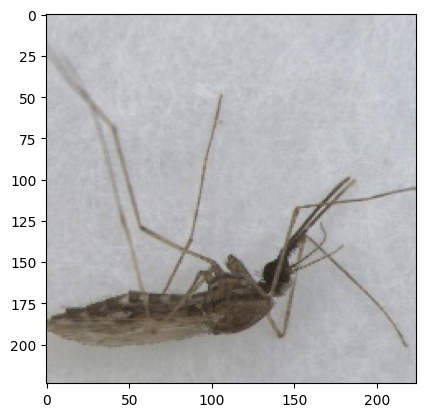

In [10]:
# looking at a random image

plt.imshow(image.load_img(np.random.choice(image_files)))
plt.show()


**Creating the Image to feed into the model**

In [11]:
# choose one which one is used

# from keras.applications.vgg16 import preprocess_input
# from keras.applications.vgg19 import preprocess_input
# from keras.applications.resnet50 import preprocess_input
# from keras.applications.resnet import preprocess_input
# from keras.applications.resnet import preprocess_input
# from keras.applications.xception import preprocess_input
# from keras.applications.inception_v3 import preprocess_input
# from keras.applications.inception_resnet_v2 import preprocess_input
# from keras.applications.mobilenet import preprocess_input
from keras.applications.mobilenet_v2 import preprocess_input
# from keras.applications.densenet import preprocess_input
# from keras.applications.nasnet import preprocess_input
# from keras.applications.efficientnet import preprocess_input

In [12]:
# gen = ImageDataGenerator(
#     width_shift_range=0.1,
#     height_shift_range=0.1,
#     shear_range=0.1,
#     zoom_range=0.1,
#     horizontal_flip=True,
#     fill_mode='nearest',
    # preprocessing_function=preprocess_input
# )


gen = ImageDataGenerator(
    # width_shift_range=0.4,
    # height_shift_range=0.4,
    # shear_range=0.3,
    # zoom_range=0.4,
    # horizontal_flip=True,
    # fill_mode='nearest',
    preprocessing_function=preprocess_input
)

Found 300 images belonging to 3 classes.


{'AEDES': 0, 'ANOPHELES': 1, 'CULEX': 2}
min: -0.8352941 max: 0.45882356


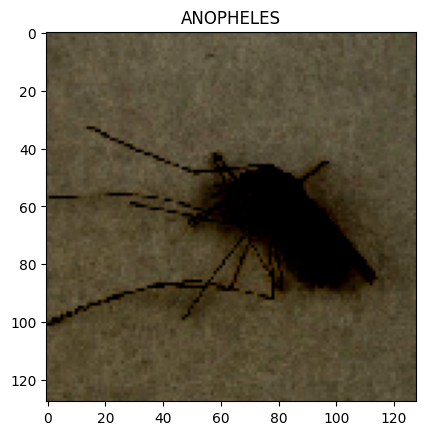

In [13]:
# testing the generator to see how it works and some other usefull things

# get label mapped for confusion matrix plot later
test_gen = gen.flow_from_directory(val_path, target_size = IMAGE_SIZE)
print(test_gen.class_indices)
labels = [None]* len(test_gen.class_indices)
for k,v in test_gen.class_indices.items():
  labels[v]=k

# should be strangely colored image (sue to VGG weights being BGR)
for x,y in test_gen:
  print("min:",x[0].min(), "max:", x[0].max())
  plt.title(labels[np.argmax(y[0])])
  plt.imshow(x[0])
  plt.show()
  break


In [14]:
#create generator

train_generator = gen.flow_from_directory(
    train_path,
    target_size = IMAGE_SIZE,
    shuffle = True,
    batch_size = batch_size
)

val_generator = gen.flow_from_directory(
    val_path,
    target_size = IMAGE_SIZE,
    shuffle = True,
    batch_size = batch_size
)

Found 2400 images belonging to 3 classes.
Found 300 images belonging to 3 classes.


In [16]:
# evaluate model

from tensorflow.keras.models import load_model


test_generator = gen.flow_from_directory(
    test_path,
    target_size = IMAGE_SIZE,
    shuffle = True,
    batch_size = batch_size
)


model = load_model('MPANet.h5')
evaluation = model.evaluate(train_generator)
evaluation = model.evaluate(val_generator)
evaluation = model.evaluate(test_generator)

Found 300 images belonging to 3 classes.
19/19 [==============================] - 1s 37ms/step - loss: 0.0092 - accuracy: 1.0000


# XAI Part

In [17]:
!pip install -q xplique

import numpy as np
from matplotlib import pyplot as plt
import tensorflow as tf
from math import ceil
import cv2

%matplotlib inline
%config InlineBackend.figure_format='retina'

import xplique
from xplique.plots import plot_attributions

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 191.4/191.4 kB 4.1 MB/s eta 0:00:00


Initial Preprocessing

# Using GRADCam

In [71]:
# !cp /content/AEDES.jpeg /content/Check/test/AEDES/
# !cp /content/Anopheles.jpg /content/Check/test/ANOPHELES/
# !cp /content/Culex.jpg /content/Check/test/CULEX/

In [79]:
# !zip -r /content/check.zip /content/Check

  adding: content/Check/ (stored 0%)
  adding: content/Check/test/ (stored 0%)
  adding: content/Check/test/AEDES/ (stored 0%)
  adding: content/Check/test/AEDES/AEDES.jpeg (deflated 3%)
  adding: content/Check/test/.ipynb_checkpoints/ (stored 0%)
  adding: content/Check/test/ANOPHELES/ (stored 0%)
  adding: content/Check/test/ANOPHELES/Anopheles.jpg (deflated 15%)
  adding: content/Check/test/CULEX/ (stored 0%)
  adding: content/Check/test/CULEX/Culex.jpg (deflated 10%)
  adding: content/Check/.ipynb_checkpoints/ (stored 0%)


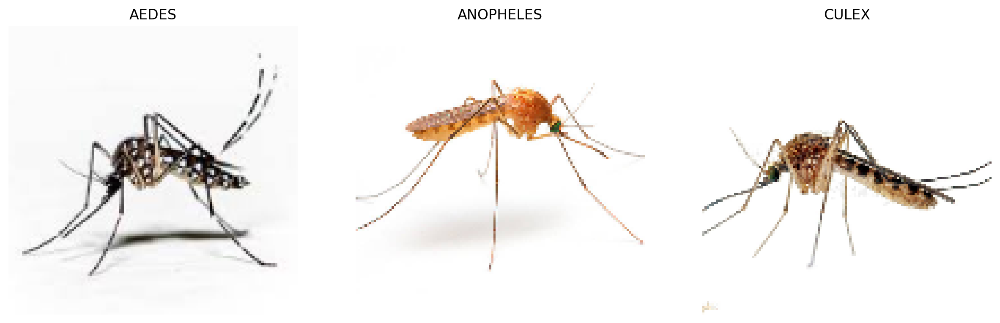

/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


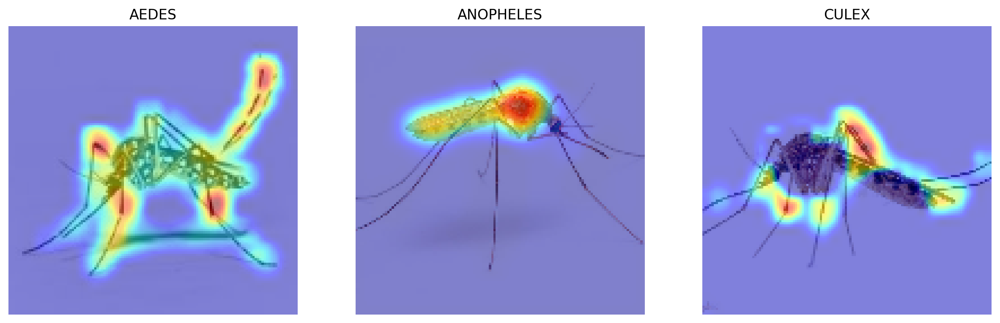

In [72]:
import os
import cv2
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
import random
from xplique.attributions import GradCAM
from sklearn.preprocessing import LabelEncoder, OneHotEncoder


# Define preprocessing function
def central_crop_and_resize(img, size=128):
    """
    Given a numpy array, extracts the largest possible square and resizes it to
    the requested size.
    """
    h, w, _ = img.shape

    min_side = min(h, w)
    max_side_center = max(h, w) // 2.0

    min_cut = int(max_side_center - min_side // 2)
    max_cut = int(max_side_center + min_side // 2)

    img = img[:, min_cut:max_cut] if w > h else img[min_cut:max_cut]
    img = tf.image.resize(img, (size, size))

    return img

# Set up directory paths
dataset_path = 'Check'
categories = ['test']  # Only taking images from the "test" folder
classes = ['AEDES', 'ANOPHELES', 'CULEX']

# Load and preprocess images
X = []
Y = []
label_mapping = {cls: idx for idx, cls in enumerate(classes)}

for category in categories:
    for cls in classes:
        cls_path = os.path.join(dataset_path, category, cls)
        image_names = os.listdir(cls_path)

        # Randomly select 1 image from each class
        selected_images = random.sample(image_names, 1)

        for img_name in selected_images:
            img_path = os.path.join(cls_path, img_name)
            img = cv2.imread(img_path)[..., ::-1]  # Convert BGR to RGB
            img = central_crop_and_resize(img).numpy()  # Convert to numpy array
            label = label_mapping[cls]

            X.append(img)
            Y.append(label)

# Convert lists to arrays
X = np.array(X, dtype=np.float32)
Y = np.array(Y)

# Normalize images
X = X / 255.0

# Visualize preprocessed images with labels
plt.rcParams["figure.figsize"] = [15, 6]
for i in range(len(X)):
    plt.subplot(1, len(X), i + 1)
    plt.imshow(X[i])
    plt.title(classes[Y[i]])
    plt.axis('off')
plt.savefig('the mosquitoes.png')
plt.show()

# Load the MPANet model
model = tf.keras.models.load_model('MPANet.h5')


# Create the GradCAM explainer
explainer = GradCAM(model)

# Get the preprocessing function from the model
preprocessing = tf.keras.applications.mobilenet_v2.preprocess_input

# Preprocess the images for the model
X_preprocessed = preprocessing(X * 255.0)

# Encode labels for the GradCAM explainer
onehot_encoder = OneHotEncoder(sparse=False, categories=[np.arange(len(classes))])
Y_onehot = onehot_encoder.fit_transform(Y.reshape(-1, 1))

# Generate explanations
explanations = explainer(X_preprocessed, Y_onehot)

# Plot the attribution on top of the images
plt.figure(figsize=(15,6))
for i, (image, explanation) in enumerate(zip(X, explanations)):
    plt.subplot(1, len(explanations), i + 1)
    plt.imshow(image)
    plt.imshow(explanation, cmap="jet", alpha=0.5)
    plt.title(classes[Y[i]])

    plt.axis('off')

plt.savefig('Gradcam.png')
plt.show()


In [47]:
X_preprocessed
Y_onehot

array([[1., 0., 0.],
       [0., 1., 0.],
       [0., 0., 1.]])

Method: Saliency


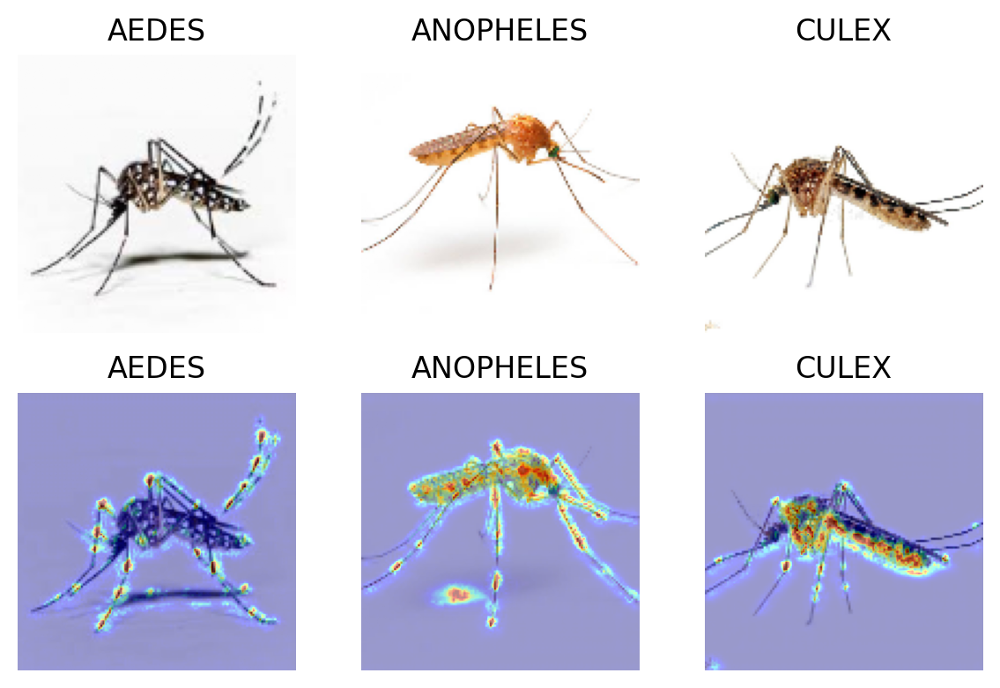



Method: GradientInput


<Figure size 1500x600 with 0 Axes>

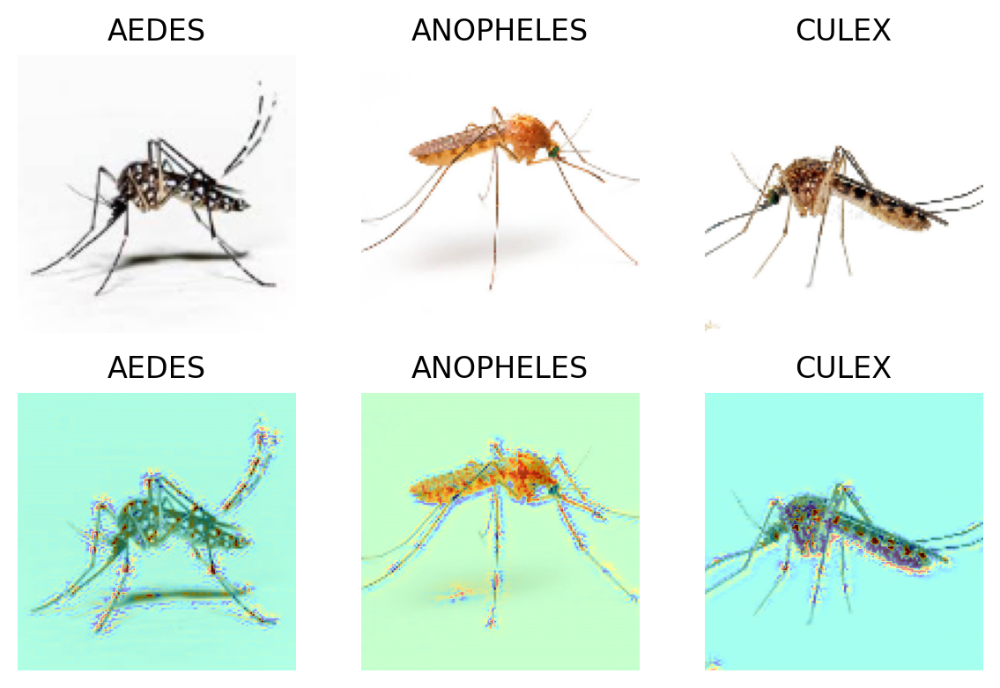



Method: GuidedBackprop


<Figure size 1500x600 with 0 Axes>

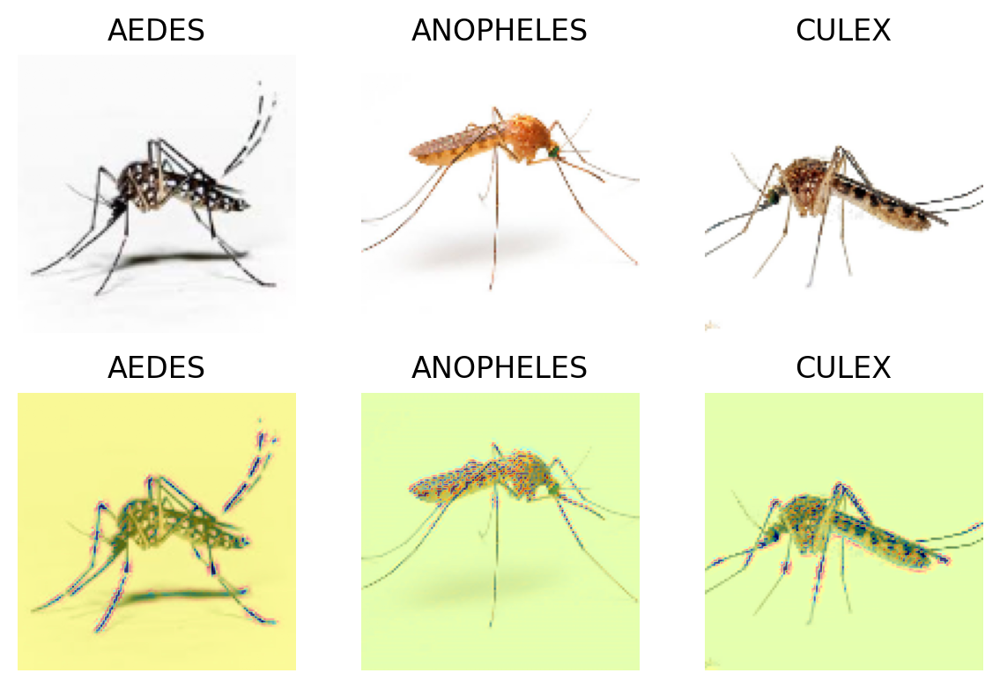



Method: IntegratedGradients


<Figure size 1500x600 with 0 Axes>

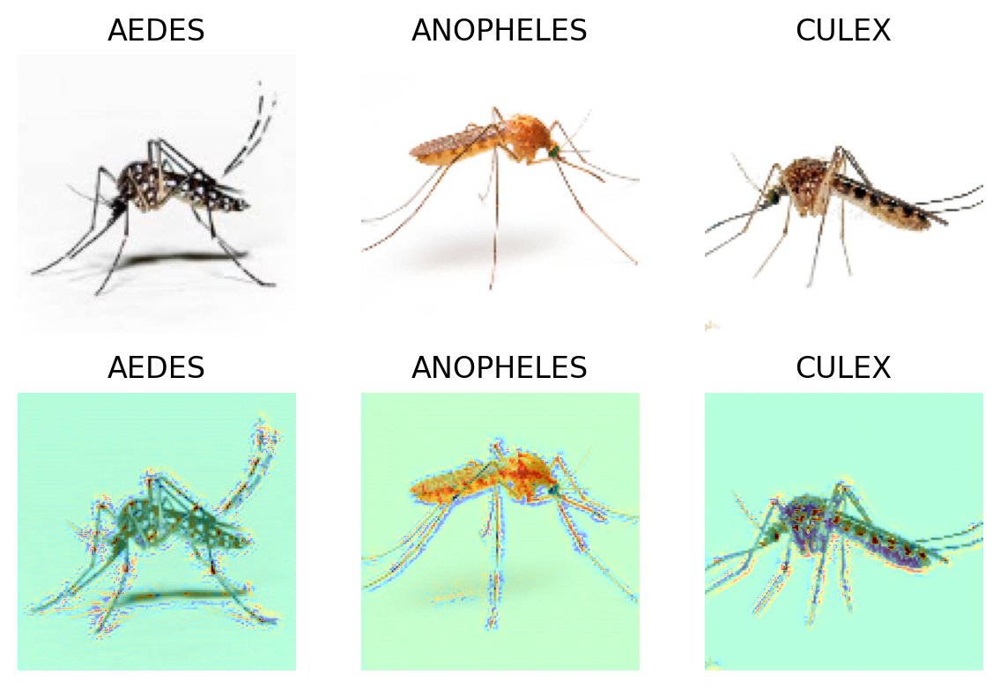



Method: SmoothGrad


<Figure size 1500x600 with 0 Axes>

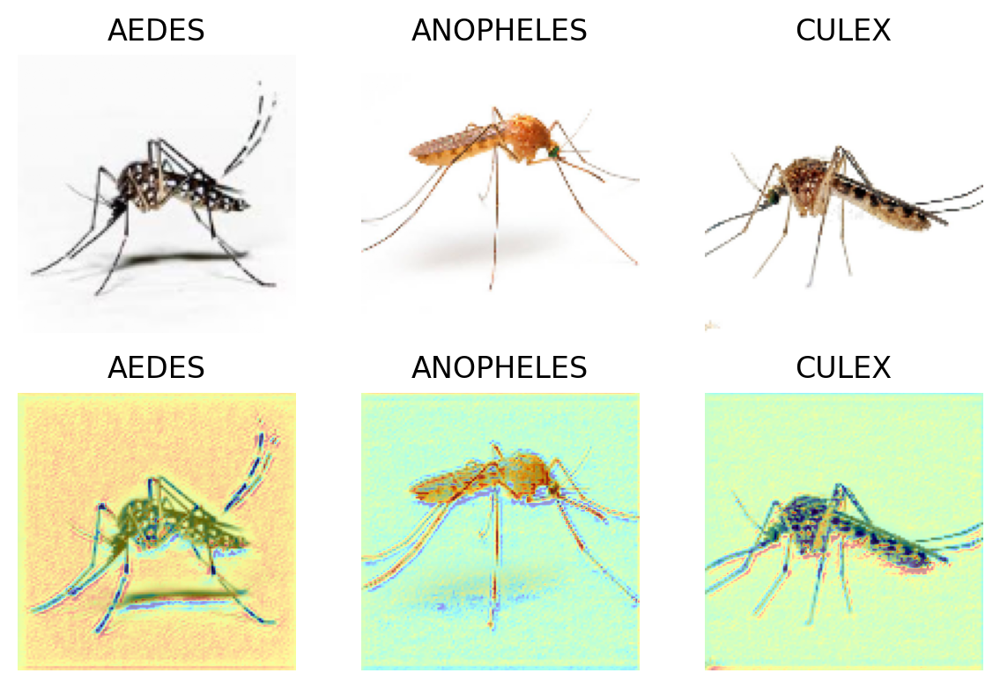



Method: SquareGrad


<Figure size 1500x600 with 0 Axes>

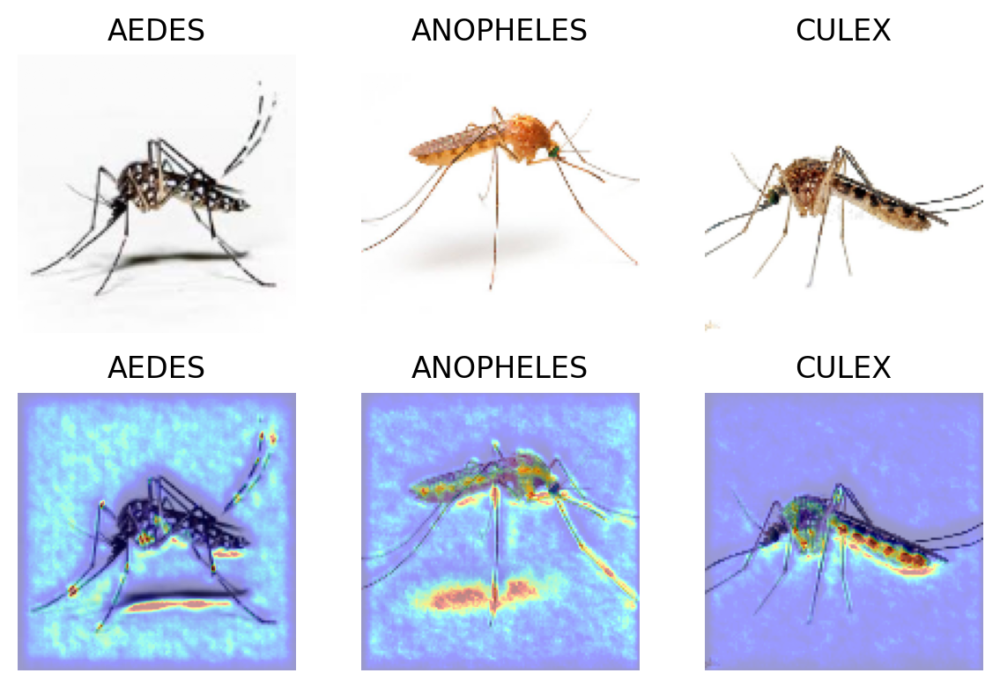



Method: VarGrad


<Figure size 1500x600 with 0 Axes>

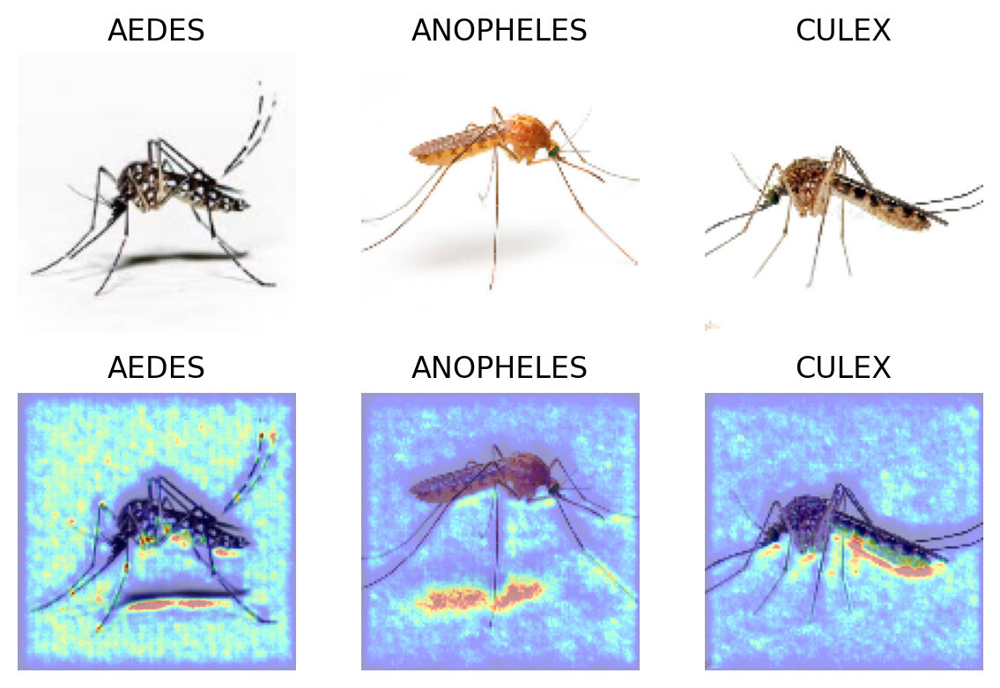



Method: GradCAM


<Figure size 1500x600 with 0 Axes>

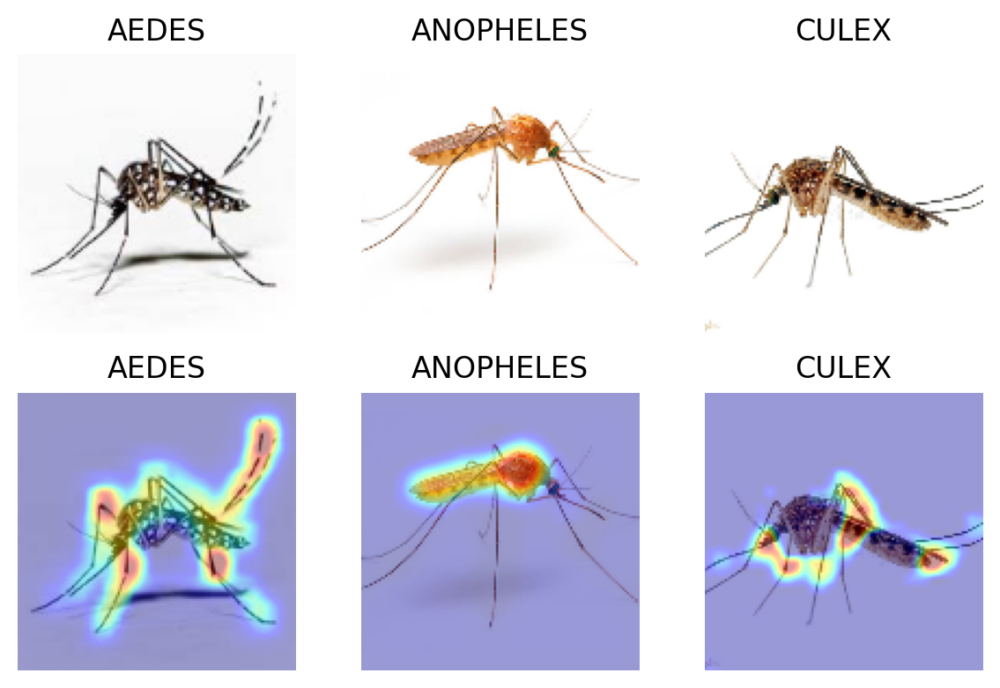



Method: Occlusion


<Figure size 1500x600 with 0 Axes>

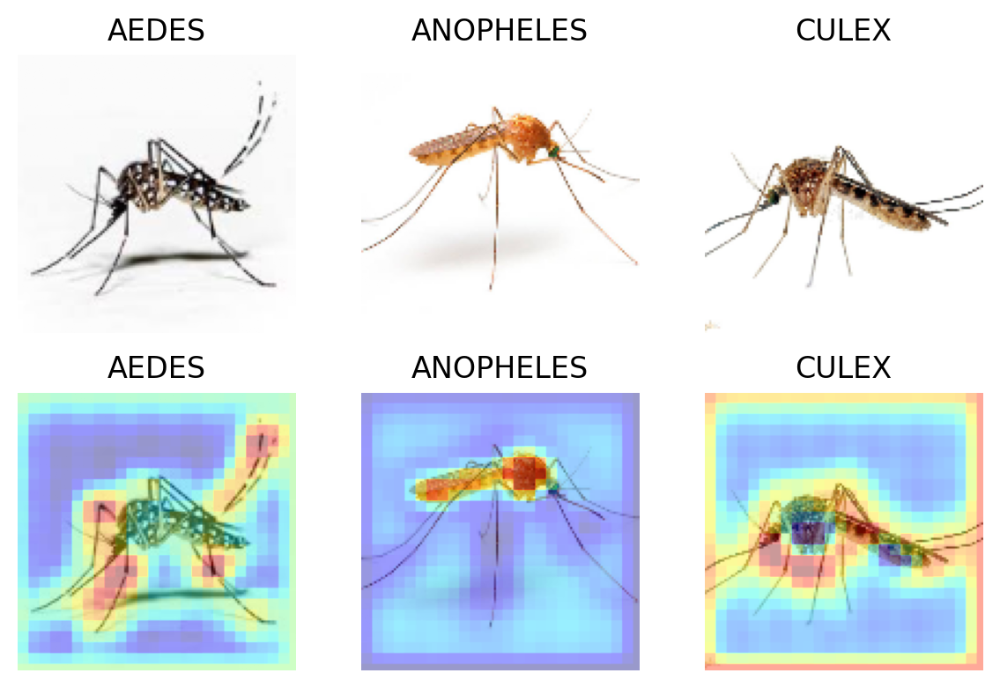



Method: Rise


<Figure size 1500x600 with 0 Axes>

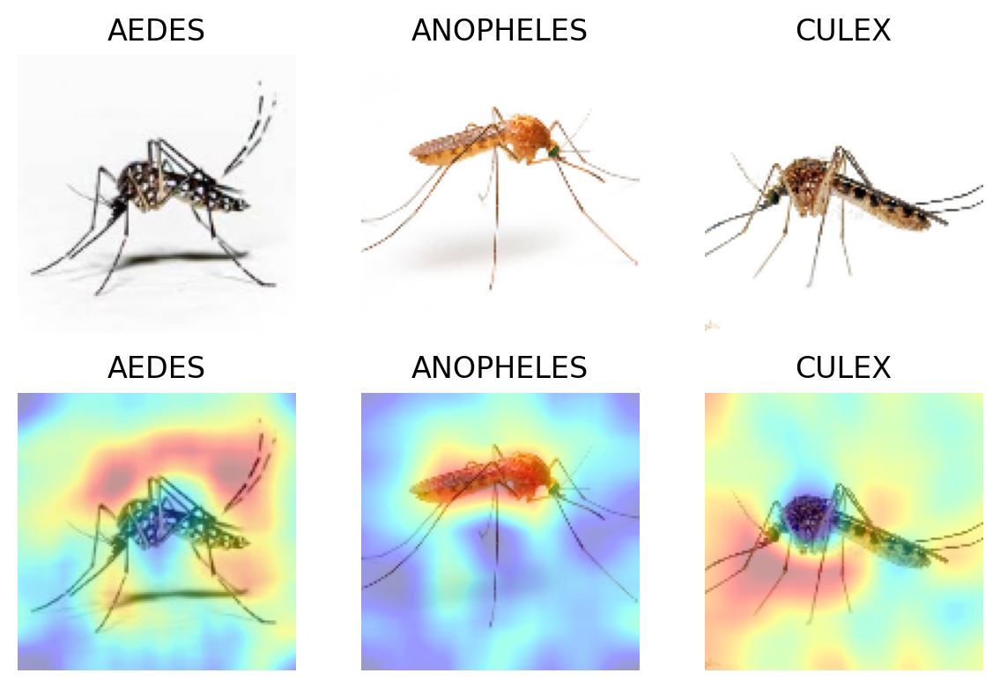



Method: SobolAttributionMethod


<Figure size 1500x600 with 0 Axes>

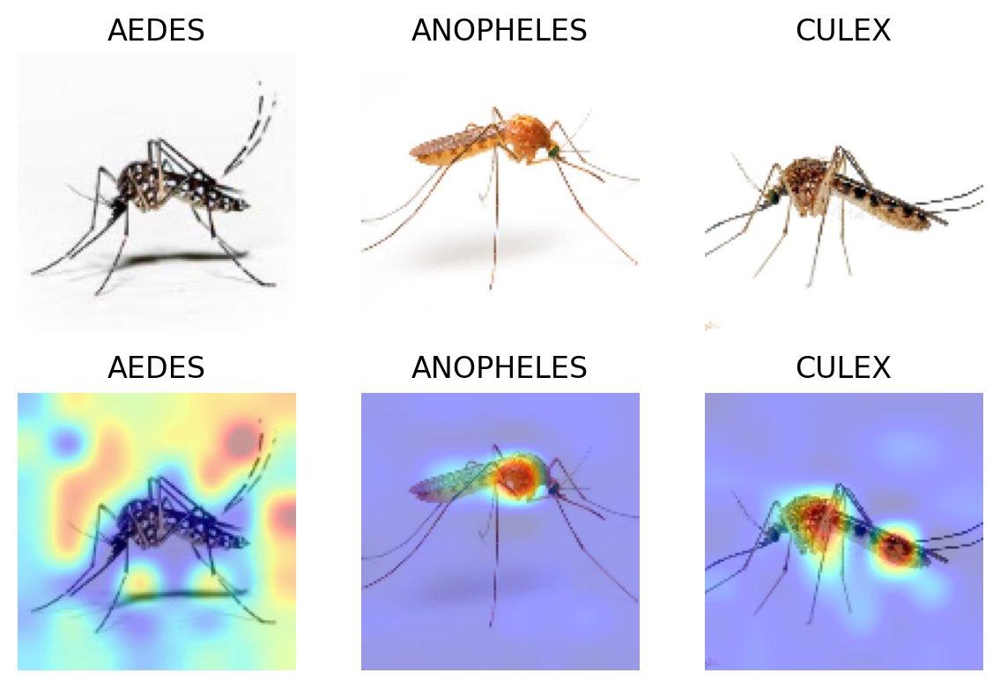



Method: Lime


<Figure size 1500x600 with 0 Axes>

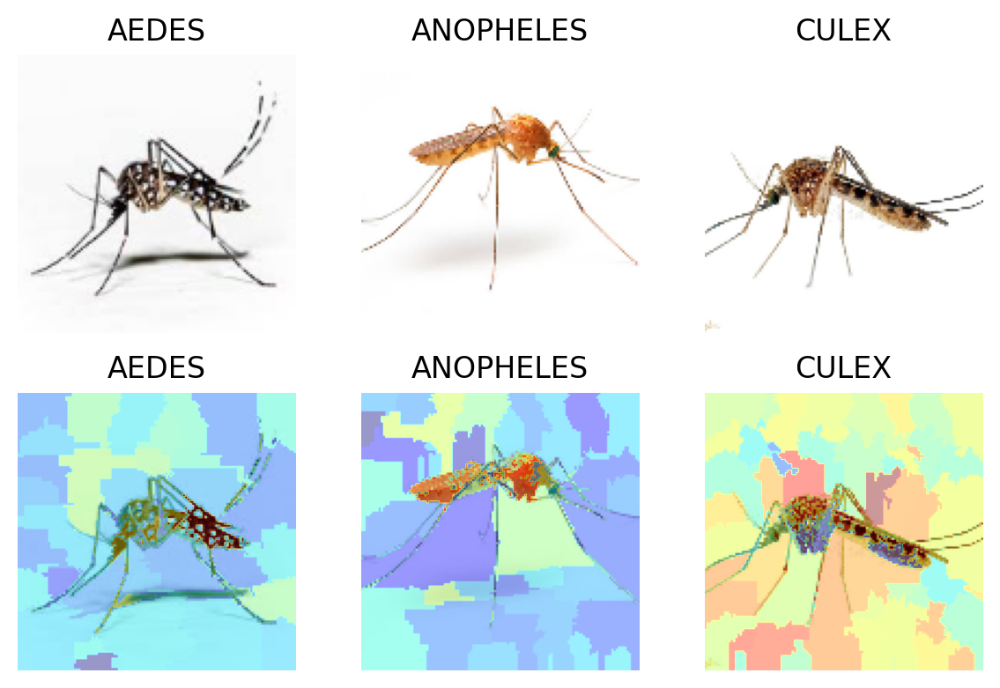



Method: KernelShap


<Figure size 1500x600 with 0 Axes>

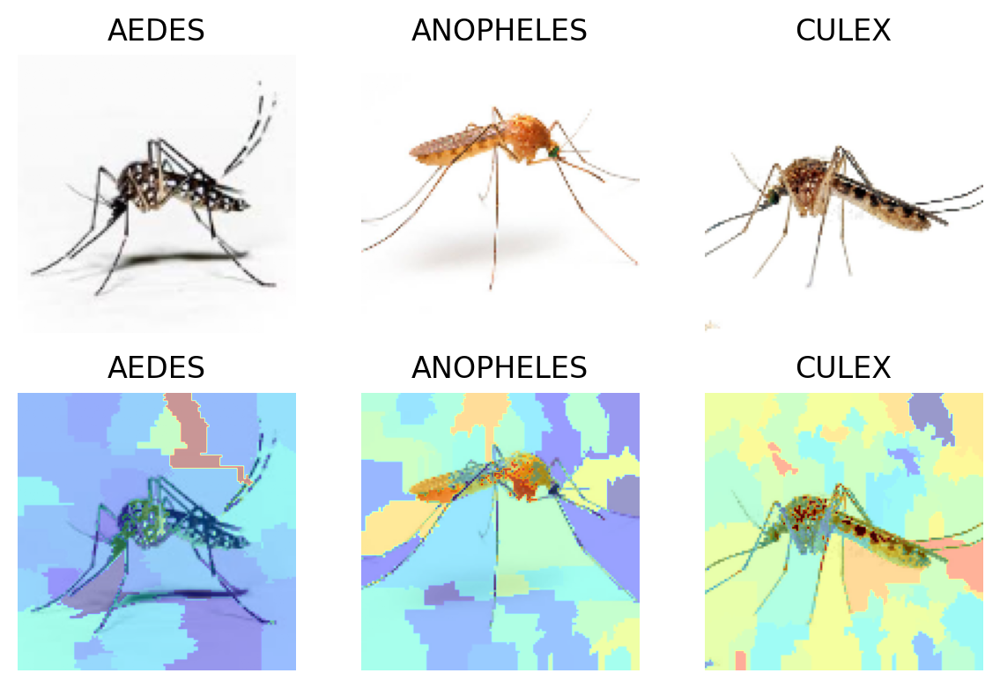

<Figure size 1500x600 with 0 Axes>

In [83]:
import os
import cv2
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
import random
from xplique.attributions import (Saliency, GradientInput, IntegratedGradients, SmoothGrad, VarGrad,
                                  SquareGrad, GradCAM, Occlusion, Rise, GuidedBackprop,
                                  GradCAMPP, Lime, KernelShap, SobolAttributionMethod)
from sklearn.preprocessing import OneHotEncoder

# Load the MPANet model
model = tf.keras.models.load_model('MPANet.h5')

# Modify the model to output logits
model.layers[-1].activation = tf.keras.activations.linear
batch_size = 16

# Define the explainers
explainers = [
    Saliency(model),
    GradientInput(model),
    GuidedBackprop(model),
    IntegratedGradients(model, steps=80, batch_size=batch_size),
    SmoothGrad(model, nb_samples=80, batch_size=batch_size),
    SquareGrad(model, nb_samples=80, batch_size=batch_size),
    VarGrad(model, nb_samples=80, batch_size=batch_size),
    GradCAM(model),
    Occlusion(model, patch_size=10, patch_stride=5, batch_size=batch_size),
    Rise(model, nb_samples=300, batch_size=batch_size),
    SobolAttributionMethod(model, batch_size=batch_size),
    Lime(model, nb_samples=100),
    KernelShap(model, nb_samples=100)
]

def plot_attributions(attributions, images, labels, img_size=2., cmap='jet', alpha=0.4, cols=1, absolute_value=True, clip_percentile=0.5):
    rows = len(attributions) // cols + 1  # Add 1 row for original images
    fig, axes = plt.subplots(rows, cols, figsize=(img_size * cols, img_size * rows))
    if rows == 1:
        axes = np.expand_dims(axes, axis=0)

    # Plot original images with labels
    for i, (img, label) in enumerate(zip(images, labels)):
        row, col = divmod(i, cols)
        axes[row, col].imshow(img)
        axes[row, col].set_title(classes[label])
        axes[row, col].axis('off')

    # Plot attribution maps
    for i, (attr, img, label) in enumerate(zip(attributions, images, labels)):
        row, col = divmod(i + cols, cols)  # Start from the second row
        ax = axes[row, col]
        ax.imshow(img)
        ax.set_title(classes[label])
        attr = np.clip(attr, np.percentile(attr, clip_percentile), np.percentile(attr, 100 - clip_percentile))
        ax.imshow(attr, cmap=cmap, alpha=alpha)
        ax.axis('off')
    plt.tight_layout()
    plt.show()

# Explain and plot
for explainer in explainers:
    explanations = explainer(X_preprocessed, Y_onehot)
    method = explainer.__class__.__name__
    print(f"Method: {method}")
    plot_attributions(explanations, X, Y, img_size=2., cmap='jet', alpha=0.4, cols=len(X), absolute_value=True, clip_percentile=0.5)
    plt.show()
    plt.savefig(f"{method}.png")
    print("\n")


In [ ]:
import os
import cv2
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
import random
from xplique.attributions import (Saliency, GradientInput, IntegratedGradients, SmoothGrad, VarGrad,
                                  SquareGrad, GradCAM, Occlusion, Rise, GuidedBackprop, DeconvNet,
                                  GradCAMPP, Lime, KernelShap, SobolAttributionMethod)
from sklearn.preprocessing import OneHotEncoder
import matplotlib.gridspec as gridspec
from matplotlib.colors import LinearSegmentedColormap


# Define preprocessing function
def central_crop_and_resize(img, size=128):
    h, w, _ = img.shape
    min_side = min(h, w)
    max_side_center = max(h, w) // 2.0
    min_cut = int(max_side_center - min_side // 2)
    max_cut = int(max_side_center + min_side // 2)
    img = img[:, min_cut:max_cut] if w > h else img[min_cut:max_cut]
    img = tf.image.resize(img, (size, size))
    return img

def show_explanation(explanation, alpha=.5, percentile=0.1, ax=None, cmap='jet'):
    explanation = np.abs(explanation)
    if explanation.shape[-1] == 3:
        explanation = np.mean(explanation, -1)
    if percentile is not None:
        clip_min = np.percentile(explanation, percentile)
        clip_max = np.percentile(explanation, 100 - percentile)
        explanation = np.clip(explanation, clip_min, clip_max)
    explanation = explanation - explanation.min()
    explanation = explanation / (explanation.max() + 1e-6)
    if ax is None:
        plt.imshow(explanation, cmap=cmap, alpha=alpha)
    else:
        ax.imshow(explanation, cmap=cmap, alpha=alpha)
    if ax is None:
        plt.axis('off')
    else:
        ax.axis('off')



def plot_class_images(cls, main_img, transformed_imgs, explainers):
    # Create a custom colormap
    cmap = LinearSegmentedColormap.from_list('custom', ['black', 'red'], N=256)

    # Set the figure size and create a grid layout
    fig = plt.figure(figsize=(16, 12))
    gs = gridspec.GridSpec(len(explainers) + 1, 3, width_ratios=[1, 1, 0.1], wspace=0.1, hspace=0.2)

    # Display the main image
    ax_main = plt.subplot(gs[0, 0])
    ax_main.imshow(main_img)
    ax_main.set_title(f"Class: {cls}", fontsize=16, fontweight='bold')
    ax_main.axis('off')

    # Display the transformed images
    for explainer_id, explainer in enumerate(explainers):
        explainer_name = explainer.__class__.__name__

        # Plot the transformed image
        ax_exp = plt.subplot(gs[explainer_id + 1, 0])
        ax_exp.imshow(main_img)
        img = ax_exp.imshow(transformed_imgs[explainer_id], cmap=cmap, alpha=0.5)
        ax_exp.set_title(explainer_name[:10], fontsize=12, fontweight='bold')
        ax_exp.axis('off')

        # Plot the colorbar
        ax_cbar = plt.subplot(gs[explainer_id + 1, 2])
        plt.colorbar(img, cax=ax_cbar, orientation='vertical')

    plt.tight_layout()
    plt.show()

/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(
<ipython-input-19-d3063b322aa0>:76: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


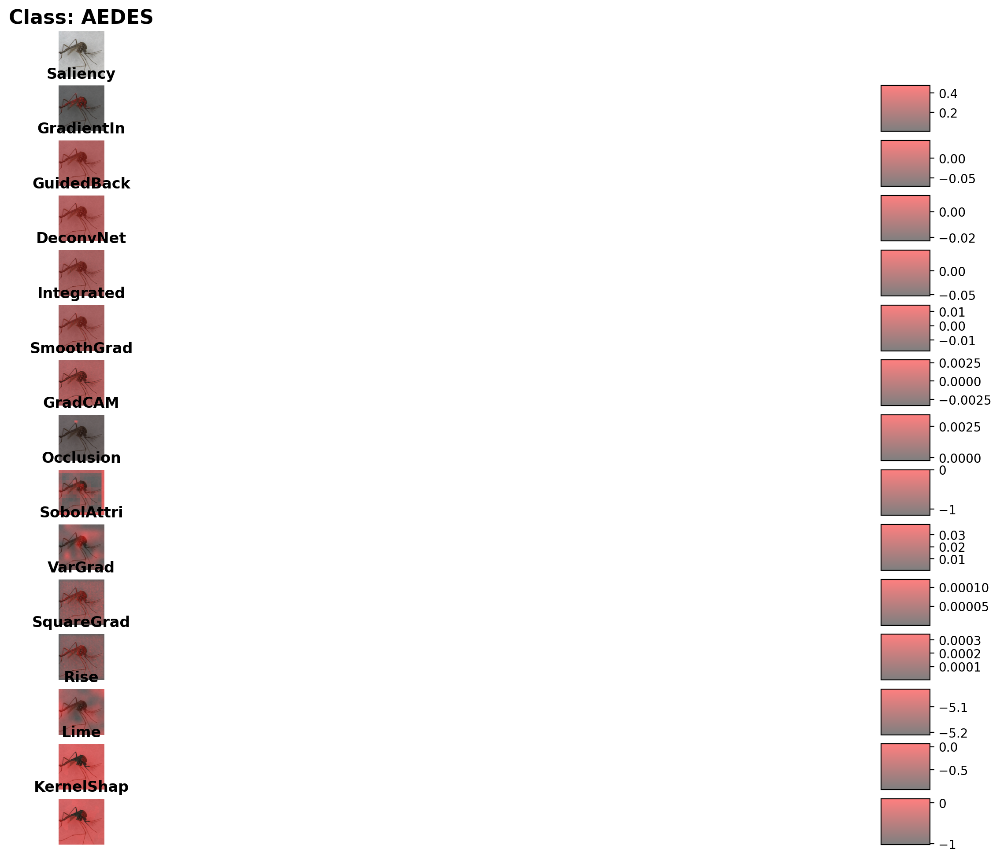

<ipython-input-19-d3063b322aa0>:76: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


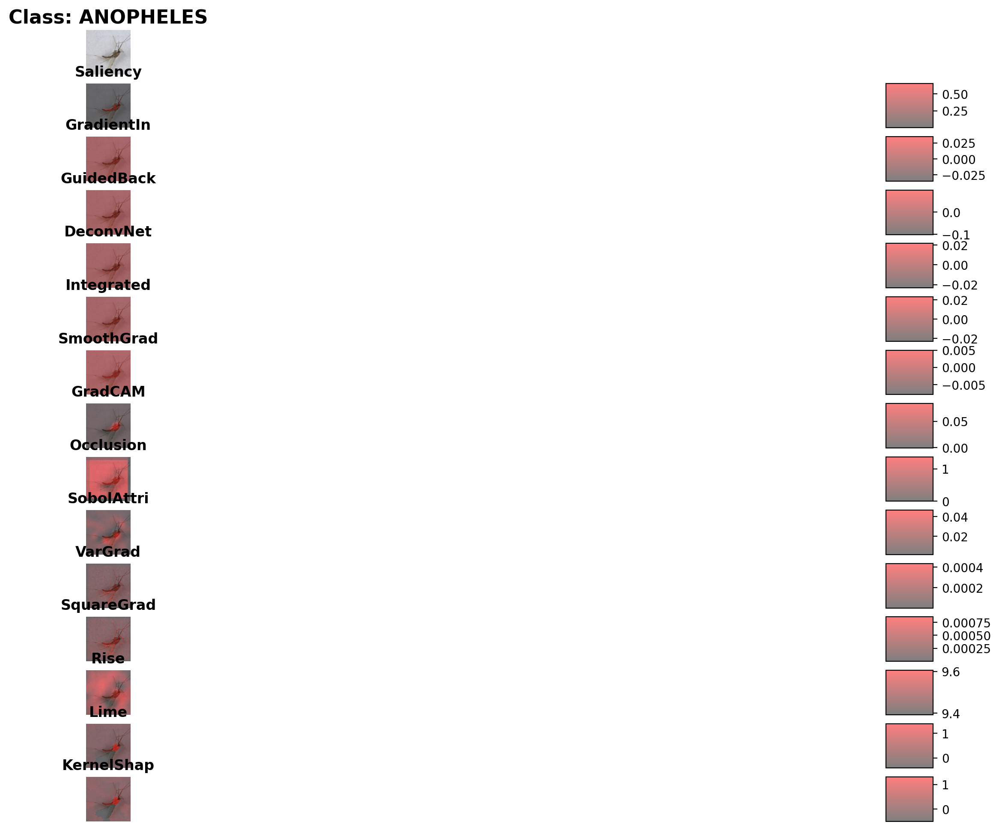

<ipython-input-19-d3063b322aa0>:76: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


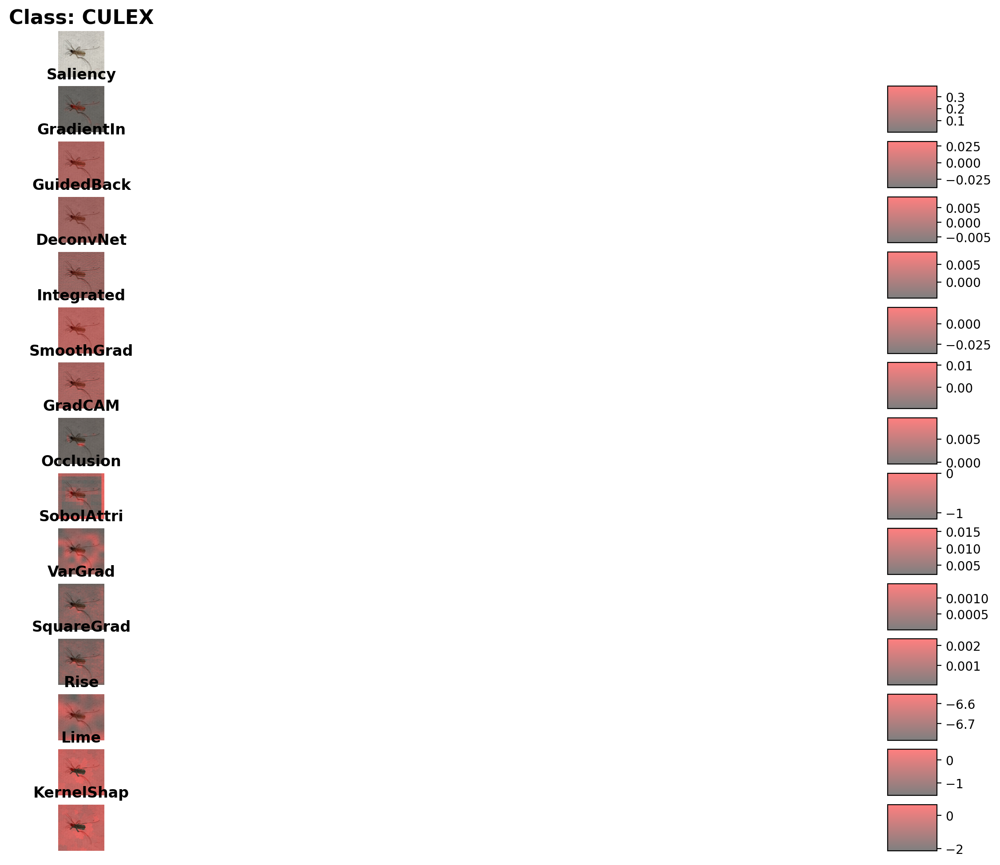

In [ ]:
# Set up directory paths
dataset_path = 'Dataset'
categories = ['test']
classes = ['AEDES', 'ANOPHELES', 'CULEX']

# Load and preprocess images
X = []
Y = []
label_mapping = {cls: idx for idx, cls in enumerate(classes)}

for category in categories:
    for cls in classes:
        cls_path = os.path.join(dataset_path, category, cls)
        image_names = os.listdir(cls_path)
        selected_images = random.sample(image_names, 1)
        for img_name in selected_images:
            img_path = os.path.join(cls_path, img_name)
            img = cv2.imread(img_path)[..., ::-1]  # Convert BGR to RGB
            img = central_crop_and_resize(img).numpy()
            label = label_mapping[cls]
            X.append(img)
            Y.append(label)

X = np.array(X, dtype=np.float32) / 255.0
Y = np.array(Y)

# Encode labels
onehot_encoder = OneHotEncoder(sparse=False, categories=[np.arange(len(classes))])
Y_onehot = onehot_encoder.fit_transform(Y.reshape(-1, 1))

# Load the MPANet model
model = tf.keras.models.load_model('MPANet.h5')

# Modify the model to output logits
model.layers[-1].activation = tf.keras.activations.linear
batch_size = 8

# Define explainers
def get_explainers(model):
    return [
        Saliency(model),
        GradientInput(model),
        GuidedBackprop(model),
        DeconvNet(model),
        IntegratedGradients(model, steps=80, batch_size=batch_size),
        SmoothGrad(model, nb_samples=80, batch_size=batch_size),
        GradCAM(model),
        Occlusion(model, patch_size=10, patch_stride=10),
        SobolAttributionMethod(model, batch_size=batch_size),
        VarGrad(model, nb_samples=80, batch_size=batch_size),
        SquareGrad(model, nb_samples=80, batch_size=batch_size),
        Rise(model, nb_samples=300, batch_size=batch_size),
        Lime(model, nb_samples=300),
        KernelShap(model, nb_samples=300)
    ]

# Initialize the explainers
explainers = get_explainers(model)

# Loop through each class and generate explanations
for cls in classes:
    # Find the index of the image corresponding to the current class
    img_index = np.where(Y == label_mapping[cls])[0][0]
    # Get the image for the current class
    img = X[img_index]

    # Compute explanations for the image of this class
    explanations = [explainer(X[img_index:img_index+1], Y_onehot[img_index:img_index+1])[0] for explainer in explainers]

    # Plot the main image and transformed images
    plot_class_images(cls, img, explanations, explainers)

/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


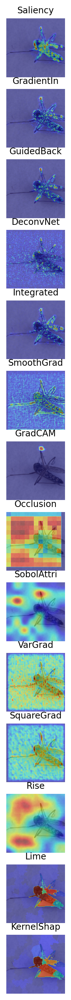

In [ ]:
import os
import cv2
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
import random
from xplique.attributions import (Saliency, GradientInput, IntegratedGradients, SmoothGrad, VarGrad,
                                  SquareGrad, GradCAM, Occlusion, Rise, GuidedBackprop, DeconvNet,
                                  GradCAMPP, Lime, KernelShap, SobolAttributionMethod)
from sklearn.preprocessing import OneHotEncoder

# Define preprocessing function
def central_crop_and_resize(img, size=128):
    h, w, _ = img.shape
    min_side = min(h, w)
    max_side_center = max(h, w) // 2.0
    min_cut = int(max_side_center - min_side // 2)
    max_cut = int(max_side_center + min_side // 2)
    img = img[:, min_cut:max_cut] if w > h else img[min_cut:max_cut]
    img = tf.image.resize(img, (size, size))
    return img

# Set up directory paths
dataset_path = 'Dataset'
categories = ['test']
classes = ['AEDES', 'ANOPHELES', 'CULEX']

# Load and preprocess images
X = []
Y = []
label_mapping = {cls: idx for idx, cls in enumerate(classes)}

for category in categories:
    for cls in classes:
        cls_path = os.path.join(dataset_path, category, cls)
        image_names = os.listdir(cls_path)
        selected_images = random.sample(image_names, 1)
        for img_name in selected_images:
            img_path = os.path.join(cls_path, img_name)
            img = cv2.imread(img_path)[..., ::-1]  # Convert BGR to RGB
            img = central_crop_and_resize(img).numpy()
            label = label_mapping[cls]
            X.append(img)
            Y.append(label)

X = np.array(X, dtype=np.float32) / 255.0
Y = np.array(Y)

# Encode labels
onehot_encoder = OneHotEncoder(sparse=False, categories=[np.arange(len(classes))])
Y_onehot = onehot_encoder.fit_transform(Y.reshape(-1, 1))

# Load the MPANet model
model = tf.keras.models.load_model('MPANet.h5')

# Modify the model to output logits
model.layers[-1].activation = tf.keras.activations.linear
batch_size = 16

# Define explainers
def get_explainers(model):
    return [
        Saliency(model),
        GradientInput(model),
        GuidedBackprop(model),
        DeconvNet(model),
        IntegratedGradients(model, steps=80, batch_size=batch_size),
        SmoothGrad(model, nb_samples=80, batch_size=batch_size),
        GradCAM(model),
        Occlusion(model, patch_size=10, patch_stride=10),
        SobolAttributionMethod(model, batch_size=batch_size),
        VarGrad(model, nb_samples=80, batch_size=batch_size),
        SquareGrad(model, nb_samples=80, batch_size=batch_size),
        Rise(model, nb_samples=300, batch_size=batch_size),
        Lime(model, nb_samples=300),
        KernelShap(model, nb_samples=300)
    ]

# Prepare a plotting function to show the explanation
def show_explanation(explanation, alpha=.5, percentile=0.1):
    explanation = np.abs(explanation)
    if explanation.shape[-1] == 3:
        explanation = np.mean(explanation, -1)
    if percentile is not None:
        clip_min = np.percentile(explanation, percentile)
        clip_max = np.percentile(explanation, 100 - percentile)
        explanation = np.clip(explanation, clip_min, clip_max)
    explanation = explanation - explanation.min()
    explanation = explanation / (explanation.max() + 1e-6)
    plt.imshow(explanation, cmap='jet', alpha=alpha)
    plt.axis('off')

# Initialize the explainers and plot the explanations
explainers = get_explainers(model)
# Set the figure size larger
plt.rcParams["figure.figsize"] = [20, 20]

# Loop through each explainer and generate explanations
for explainer_id, explainer in enumerate(explainers):
    explainer_name = explainer.__class__.__name__
    # Compute the explanation for the given explainer (all the explainers share the same API)
    explanation = explainer(X, Y_onehot)[0]
    plt.subplot(len(explainers), 1, explainer_id + 1)
    plt.title(explainer_name[:10], fontsize=10)
    plt.imshow(X[0])
    show_explanation(explanation)

plt.show()


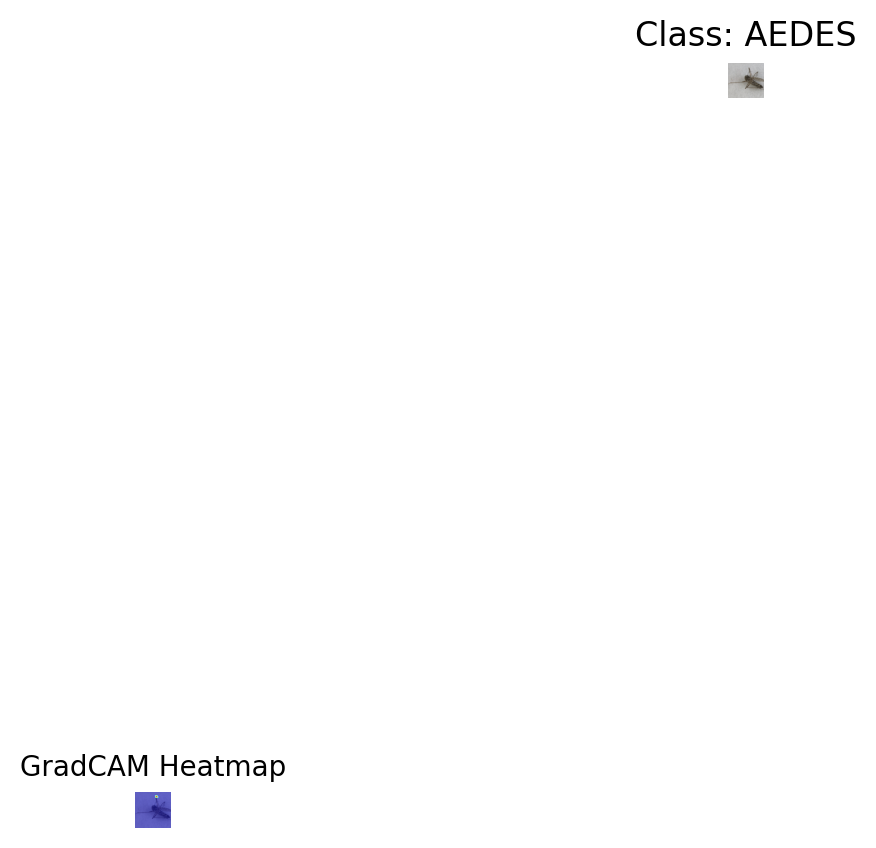

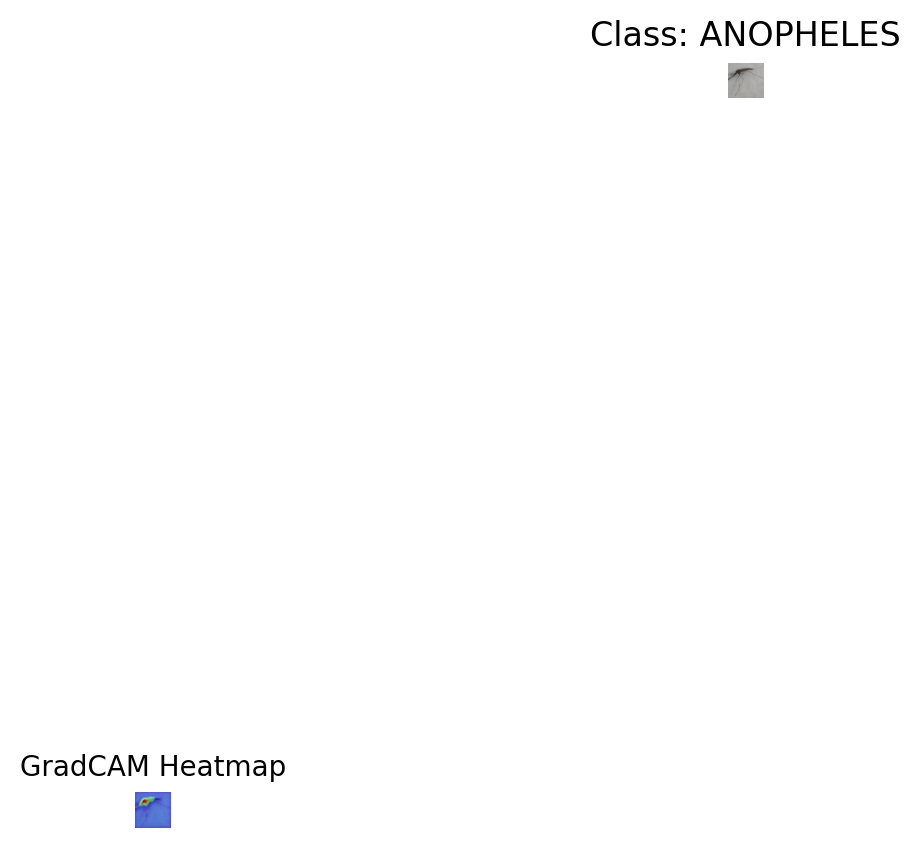

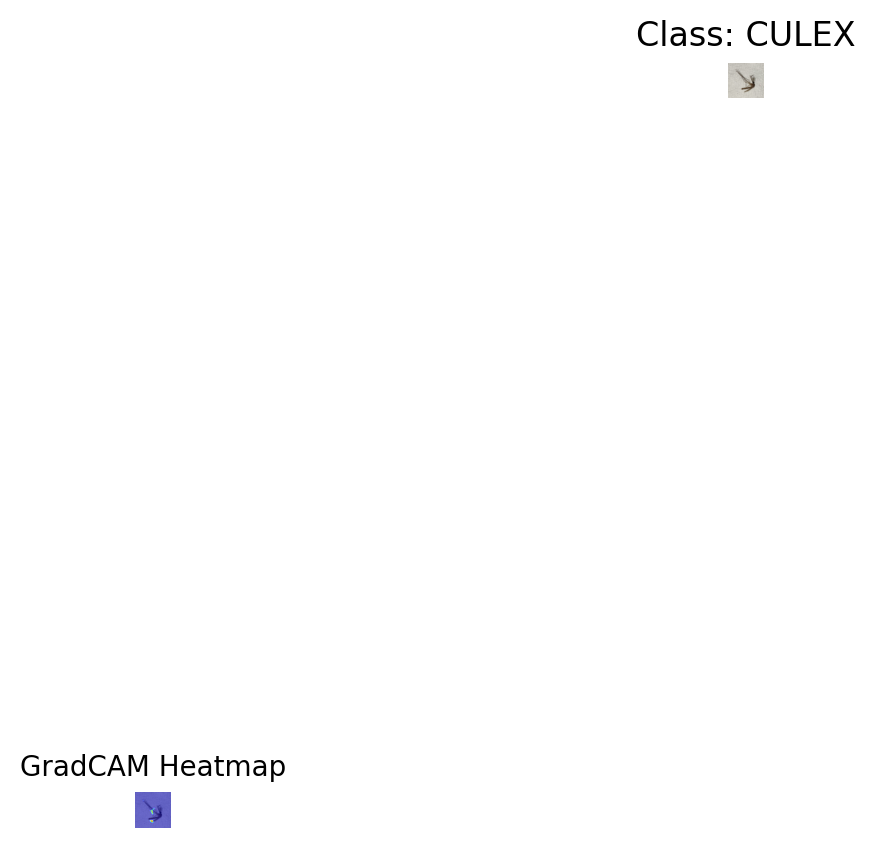

In [ ]:
from matplotlib import gridspec

# Loop through each class and display one image along with GradCAM heatmaps for each layer
for cls in classes:
    # Find the index of the image corresponding to the current class
    img_index = np.where(Y == label_mapping[cls])[0][0]
    # Get the image for the current class
    img = X[img_index]

    # Create a grid with custom layout
    fig = plt.figure(figsize=(12, 8))
    gs = gridspec.GridSpec(len(explainers) + 1, 2, width_ratios=[1, 1])

    # Display the main image
    ax_main = plt.subplot(gs[0, :])
    ax_main.imshow(img)
    ax_main.set_title(f"Class: {cls}")
    ax_main.axis('off')

    # Compute GradCAM heatmaps for the image of this class for each layer
    for explainer_id, explainer in enumerate(explainers):
        explainer_name = explainer.__class__.__name__
        # Compute the GradCAM heatmap for the given explainer
        if explainer_name == "GradCAM":
            gradcam_heatmap = explainer(X[img_index:img_index+1], Y_onehot[img_index:img_index+1])[0]
            # Display the original image with GradCAM heatmap
            ax_exp = plt.subplot(gs[explainer_id + 1, 0])
            ax_exp.imshow(img)
            ax_exp.imshow(gradcam_heatmap, cmap='jet', alpha=0.5)
            ax_exp.set_title("GradCAM Heatmap", fontsize=10)
            ax_exp.axis('off')

    plt.tight_layout()
    plt.show()

# Lime


In [ ]:
!pip install lime

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 2.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283835 sha256=730b84723dd75758dcc97186a3137a17fa68f42c19f5f41d02bbbc2c4fa70d15
  Stored in directory: /root/.cache/pip/wheels/fd/a2/af/9ac0a1a85a27f314a06b39e1f492bee1547d52549a4606ed89
Successfully built lime


In [ ]:
import matplotlib.pyplot as plt
import numpy as np

In [ ]:
import os
from PIL import Image

images = []
labels = []
file_names = []  # List to store file names

master_data_path = "/content/Dataset"
test_folder_path = os.path.join(master_data_path, "test")

def load_images_from_folder(folder_path, label):
    folder_name = os.path.basename(folder_path)  # Get the folder name
    for filename in os.listdir(folder_path):
        file_path = os.path.join(folder_path, filename)
        if os.path.isdir(file_path):
            # If the item is a directory, recursively load images from it
            load_images_from_folder(file_path, folder_name)  # Pass the folder name as the label
        elif filename.lower().endswith(('png', 'jpg', 'jpeg')):
            # If the item is an image file, load it and add it to the images list
            try:
                img = Image.open(file_path)
                images.append(img)
                labels.append(label)
                desired_filename = f"{folder_name}_{label}"  # Construct the desired file name
                file_names.append(desired_filename)  # Store the desired file name in the list
            except Exception as e:
                print(f'Error loading image {file_path}: {str(e)}')
        else:
            print(f'Skipping non-image file: {file_path}')

# Load images, labels, and file names from the "test" folder
load_images_from_folder(test_folder_path, "test")

print(f'Images loaded: {len(images)}')
print(f'Labels loaded: {len(labels)}')
print(f'File names loaded: {len(file_names)}')

Images loaded: 300
Labels loaded: 300
File names loaded: 300


ANOPHELES_test


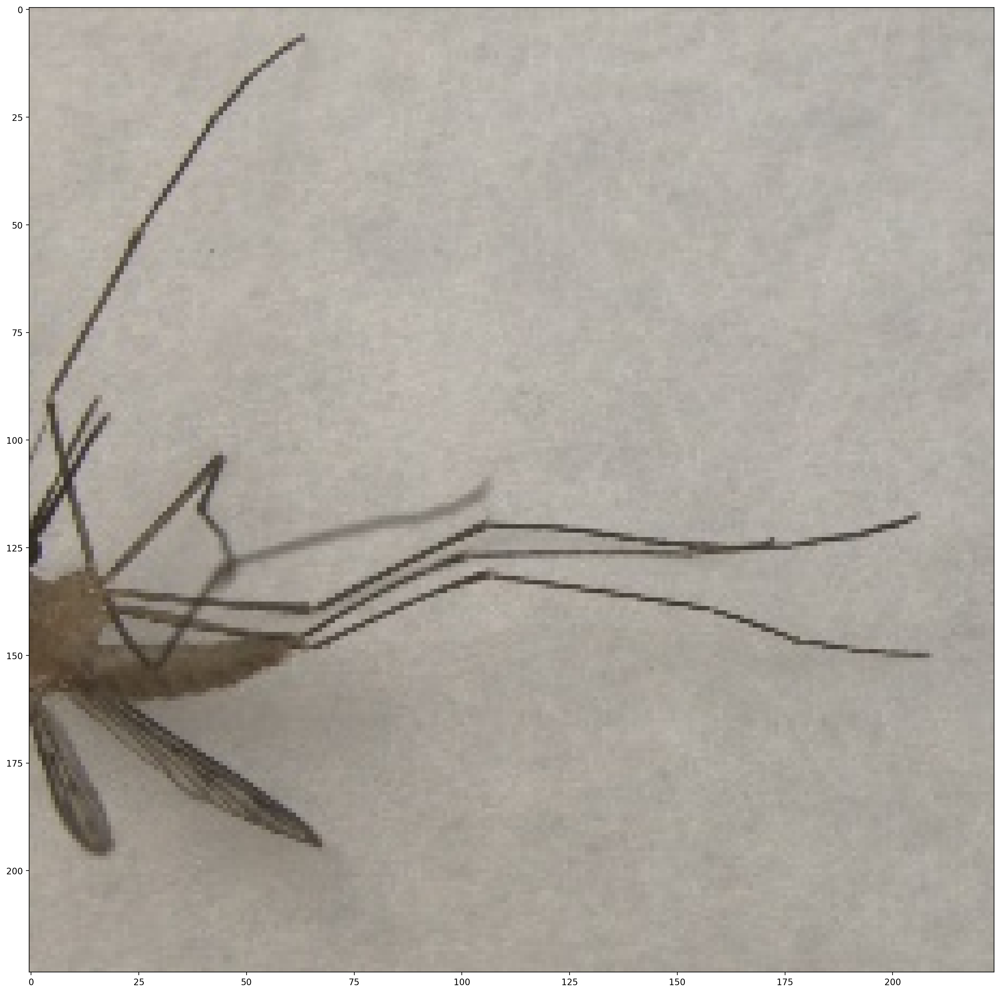

In [ ]:
print(file_names[233])
plt.imshow(images[233])
plt.show()

In [ ]:
# Convert PIL images to numpy arrays
numpy_images = [np.array(image) for image in images]

# Resize and convert images to RGB format if necessary
target_size = (128, 128)
reshaped_images = []
for idx, image in enumerate(numpy_images):
    pil_image = Image.fromarray(image)
    pil_image = pil_image.resize(target_size)
    # Convert to RGB if image is grayscale
    if pil_image.mode != 'RGB':
        pil_image = pil_image.convert('RGB')
    reshaped_images.append(np.array(pil_image))

# Shape of reshaped images
for idx, img in enumerate(reshaped_images):
    print(f'Image {idx+1} shape after resizing {img.shape}')
# Convert images to float32 and normalize to [0, 1]
normalized_images = np.array(reshaped_images, dtype=np.float32) / 255.0

# Verify the shape and data type of processed_images
print("Shape of normalized_images:", normalized_images.shape)
print("Data type of processed_images:", normalized_images.dtype)

Image 1 shape after resizing (128, 128, 3)
Image 2 shape after resizing (128, 128, 3)
Image 3 shape after resizing (128, 128, 3)
Image 4 shape after resizing (128, 128, 3)
Image 5 shape after resizing (128, 128, 3)
Image 6 shape after resizing (128, 128, 3)
Image 7 shape after resizing (128, 128, 3)
Image 8 shape after resizing (128, 128, 3)
Image 9 shape after resizing (128, 128, 3)
Image 10 shape after resizing (128, 128, 3)
Image 11 shape after resizing (128, 128, 3)
Image 12 shape after resizing (128, 128, 3)
Image 13 shape after resizing (128, 128, 3)
Image 14 shape after resizing (128, 128, 3)
Image 15 shape after resizing (128, 128, 3)
Image 16 shape after resizing (128, 128, 3)
Image 17 shape after resizing (128, 128, 3)
Image 18 shape after resizing (128, 128, 3)
Image 19 shape after resizing (128, 128, 3)
Image 20 shape after resizing (128, 128, 3)
Image 21 shape after resizing (128, 128, 3)
Image 22 shape after resizing (128, 128, 3)
Image 23 shape after resizing (128, 128, 

In [ ]:
import os
from keras.models import load_model

# Define class labels and their corresponding encoded values
class_labels = ['AEDES','ANOPHELES','CULEX']
label_to_index = {class_label: index for index, class_label in enumerate(class_labels)}

# Load the pre-trained models
model_folder = '/content/'  # Replace with the path to your model folder
model_files = os.listdir(model_folder)
loaded_models = {}

for model_file in model_files:
    try:
        model_name, extension = os.path.splitext(model_file)
        if extension == '.h5':
            model_path = os.path.join(model_folder, model_file)
            loaded_models[model_name] = load_model(model_path)
            print(f"Loaded model: {model_name}")
        else:
            print(f"Skipped file: {model_file} (not a valid model file)")
    except Exception as e:
        print(f"Error loading model {model_file}: {str(e)}")

print("Model loading completed.")

Skipped file: .config (not a valid model file)
Skipped file: Mosquito_dataset (not a valid model file)
Loaded model: MPANet
Skipped file: gdrive (not a valid model file)
Skipped file: .ipynb_checkpoints (not a valid model file)
Skipped file: mosquito-dataset-for-classification-cnn.zip (not a valid model file)
Skipped file: Dataset (not a valid model file)
Skipped file: sample_data (not a valid model file)
Model loading completed.


Model Name: MPANet
Image Name: AEDES_test
1/1 [==============================] - 1s 606ms/step
Predicted Class Label: ANOPHELES


  0%|          | 0/100 [00:00<?, ?it/s]

1/1 [==============================] - 0s 19ms/step


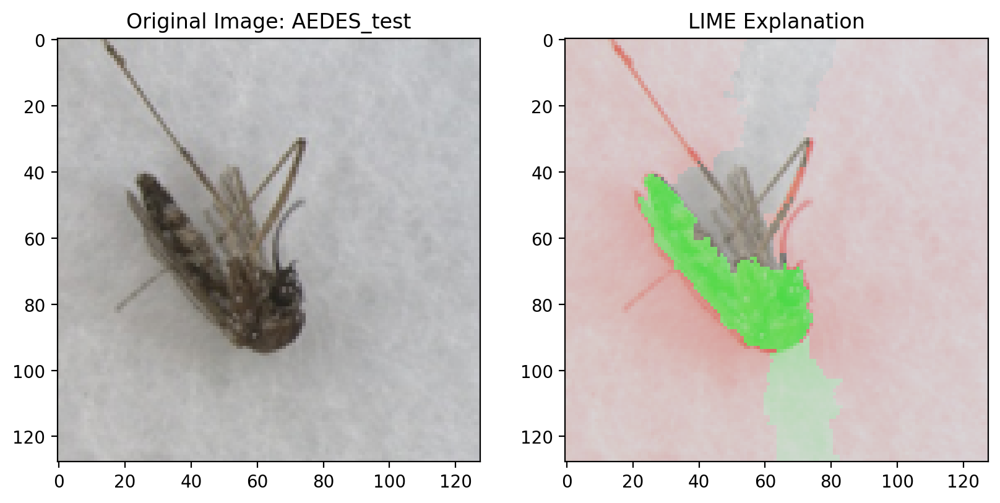

Predicted class: ANOPHELES
LIME Textual Explanation:  [[[0.8156863  0.70980394 0.69411767]
  [0.8156863  0.7254902  0.7176471 ]
  [0.8156863  0.73333335 0.7254902 ]
  ...
  [0.8156863  0.7529412  0.7647059 ]
  [0.8156863  0.7529412  0.76862746]
  [0.8156863  0.7529412  0.76862746]]

 [[0.8156863  0.7372549  0.7254902 ]
  [0.8156863  0.7372549  0.7294118 ]
  [0.8156863  0.7411765  0.73333335]
  ...
  [0.8156863  0.75686276 0.76862746]
  [0.8156863  0.76862746 0.78431374]
  [0.8156863  0.78431374 0.8       ]]

 [[0.8156863  0.7176471  0.70980394]
  [0.8156863  0.72156864 0.7137255 ]
  [0.8156863  0.7294118  0.7254902 ]
  ...
  [0.8156863  0.7607843  0.77254903]
  [0.8156863  0.7764706  0.7921569 ]
  [0.8156863  0.7764706  0.7921569 ]]

 ...

 [[0.8156863  0.7137255  0.7058824 ]
  [0.8156863  0.73333335 0.7254902 ]
  [0.8156863  0.7372549  0.7372549 ]
  ...
  [0.8156863  0.7490196  0.75686276]
  [0.8156863  0.7411765  0.75686276]
  [0.8156863  0.7411765  0.75686276]]

 [[0.8156863  0.7333

  0%|          | 0/100 [00:00<?, ?it/s]

1/1 [==============================] - 0s 22ms/step


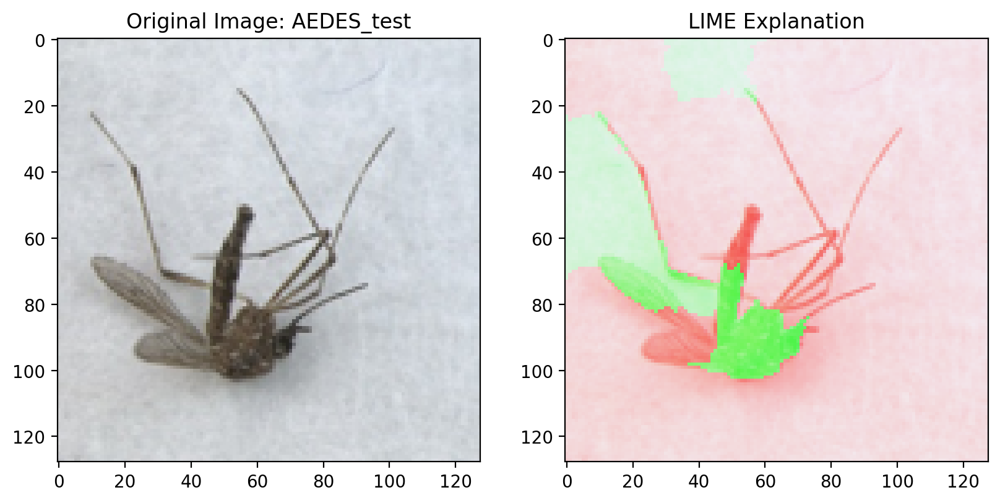

Predicted class: ANOPHELES
LIME Textual Explanation:  [[[0.94509804 0.827451   0.84705883]
  [0.94509804 0.8117647  0.83137256]
  [0.94509804 0.8117647  0.83137256]
  ...
  [0.94509804 0.8666667  0.8980392 ]
  [0.94509804 0.8784314  0.9098039 ]
  [0.94509804 0.8745098  0.90588236]]

 [[0.94509804 0.83137256 0.8509804 ]
  [0.94509804 0.8235294  0.84313726]
  [0.94509804 0.8156863  0.8352941 ]
  ...
  [0.94509804 0.8666667  0.8980392 ]
  [0.94509804 0.88235295 0.9137255 ]
  [0.94509804 0.8745098  0.90588236]]

 [[0.94509804 0.8392157  0.85882354]
  [0.94509804 0.8235294  0.8392157 ]
  [0.94509804 0.8352941  0.84705883]
  ...
  [0.94509804 0.8627451  0.89411765]
  [0.94509804 0.88235295 0.9137255 ]
  [0.94509804 0.8784314  0.9098039 ]]

 ...

 [[0.94509804 0.78039217 0.7921569 ]
  [0.94509804 0.8117647  0.81960785]
  [0.94509804 0.8156863  0.8235294 ]
  ...
  [0.94509804 0.83137256 0.84705883]
  [0.94509804 0.827451   0.84705883]
  [0.94509804 0.8156863  0.8352941 ]]

 [[0.94509804 0.7882

  0%|          | 0/100 [00:00<?, ?it/s]

1/1 [==============================] - 0s 22ms/step


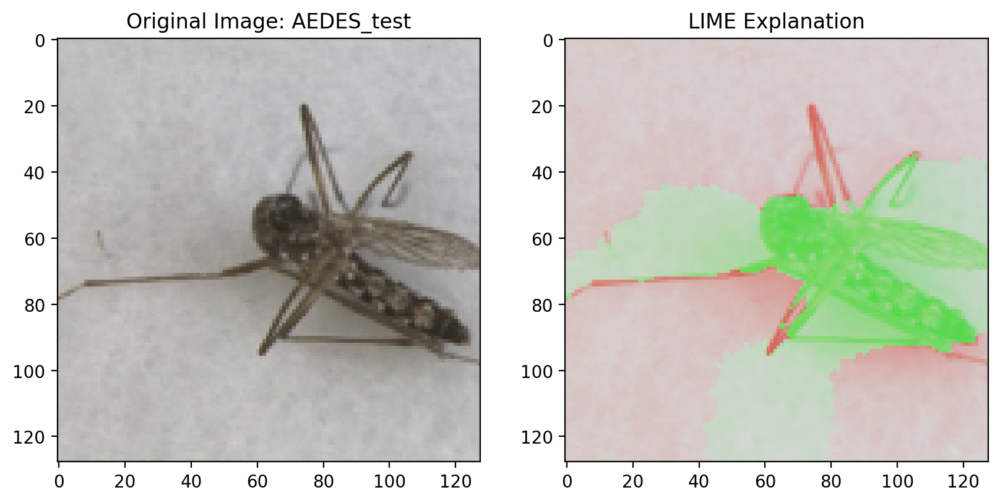

Predicted class: ANOPHELES
LIME Textual Explanation:  [[[0.8039216  0.74509805 0.7372549 ]
  [0.8039216  0.74509805 0.7372549 ]
  [0.8039216  0.7294118  0.72156864]
  ...
  [0.8039216  0.7607843  0.76862746]
  [0.8039216  0.75686276 0.77254903]
  [0.8039216  0.7411765  0.75686276]]

 [[0.8039216  0.7607843  0.7490196 ]
  [0.8039216  0.7529412  0.74509805]
  [0.8039216  0.74509805 0.7372549 ]
  ...
  [0.8039216  0.77254903 0.78039217]
  [0.8039216  0.77254903 0.7882353 ]
  [0.8039216  0.7607843  0.7764706 ]]

 [[0.8039216  0.7372549  0.73333335]
  [0.8039216  0.7490196  0.74509805]
  [0.8039216  0.7490196  0.7490196 ]
  ...
  [0.8039216  0.7764706  0.7882353 ]
  [0.8039216  0.78039217 0.79607844]
  [0.8039216  0.76862746 0.78431374]]

 ...

 [[0.8039216  0.7529412  0.74509805]
  [0.8039216  0.7372549  0.7294118 ]
  [0.8039216  0.7372549  0.7294118 ]
  ...
  [0.8039216  0.7764706  0.77254903]
  [0.8039216  0.7647059  0.7647059 ]
  [0.8039216  0.74509805 0.74509805]]

 [[0.8039216  0.7607

  0%|          | 0/100 [00:00<?, ?it/s]

1/1 [==============================] - 0s 39ms/step


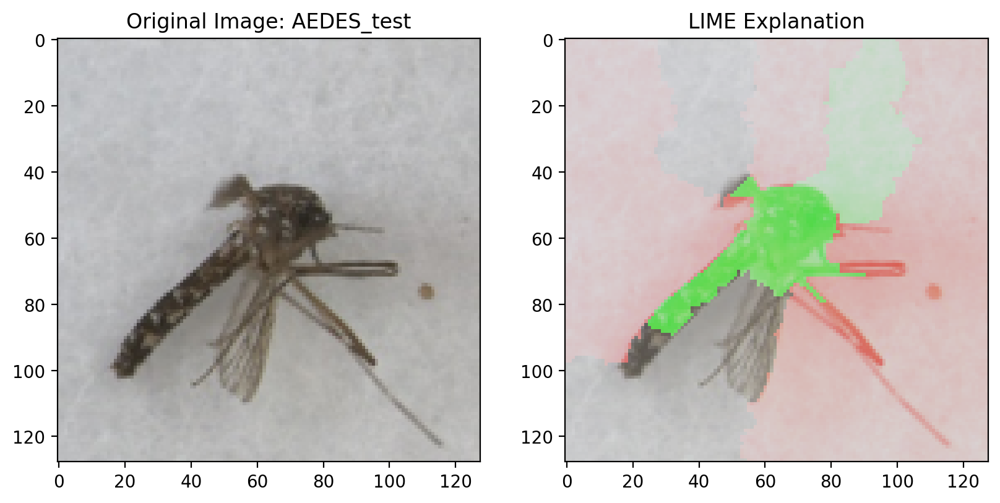

Predicted class: ANOPHELES
LIME Textual Explanation:  [[[0.8156863  0.7529412  0.75686276]
  [0.8156863  0.75686276 0.7607843 ]
  [0.8156863  0.7529412  0.75686276]
  ...
  [0.8156863  0.7372549  0.7372549 ]
  [0.8156863  0.7254902  0.7254902 ]
  [0.8156863  0.7137255  0.7137255 ]]

 [[0.8156863  0.7529412  0.7607843 ]
  [0.8156863  0.7490196  0.75686276]
  [0.8156863  0.7490196  0.7647059 ]
  ...
  [0.8156863  0.74509805 0.74509805]
  [0.8156863  0.72156864 0.72156864]
  [0.8156863  0.72156864 0.72156864]]

 [[0.8156863  0.7490196  0.75686276]
  [0.8156863  0.75686276 0.77254903]
  [0.8156863  0.75686276 0.76862746]
  ...
  [0.8156863  0.73333335 0.73333335]
  [0.8156863  0.7294118  0.7294118 ]
  [0.8156863  0.7294118  0.7294118 ]]

 ...

 [[0.73333335 0.7372549  0.74509805]
  [0.7294118  0.73333335 0.7411765 ]
  [0.73333335 0.7372549  0.74509805]
  ...
  [0.8156863  0.75686276 0.7490196 ]
  [0.8156863  0.7647059  0.75686276]
  [0.8156863  0.7529412  0.74509805]]

 [[0.7372549  0.7411

  0%|          | 0/100 [00:00<?, ?it/s]

1/1 [==============================] - 0s 71ms/step


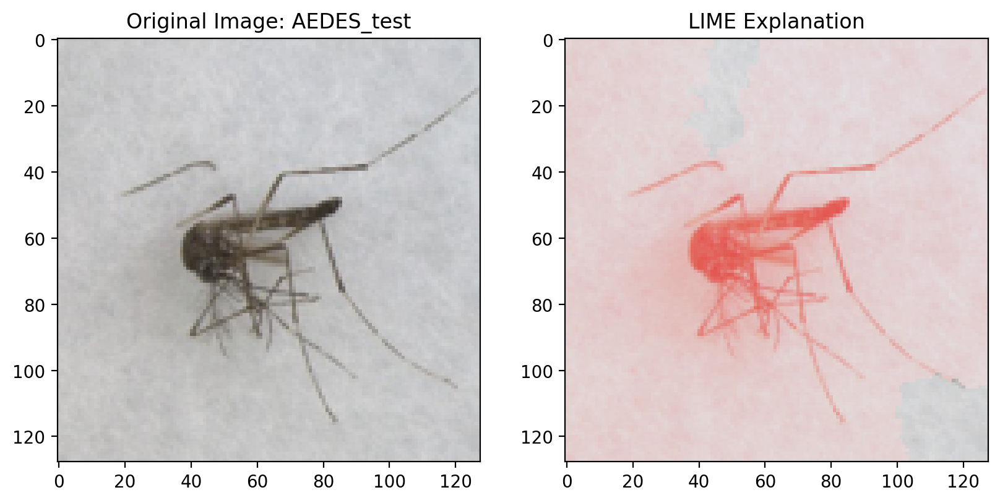

Predicted class: ANOPHELES
LIME Textual Explanation:  [[[0.8666667  0.78431374 0.7764706 ]
  [0.8666667  0.7882353  0.78039217]
  [0.8666667  0.76862746 0.76862746]
  ...
  [0.8666667  0.7921569  0.8039216 ]
  [0.8666667  0.78039217 0.7921569 ]
  [0.8666667  0.77254903 0.78431374]]

 [[0.8666667  0.8039216  0.79607844]
  [0.8666667  0.8        0.7921569 ]
  [0.8666667  0.7764706  0.7764706 ]
  ...
  [0.8666667  0.8039216  0.8156863 ]
  [0.8666667  0.7921569  0.8039216 ]
  [0.8666667  0.78431374 0.79607844]]

 [[0.8666667  0.8117647  0.8039216 ]
  [0.8666667  0.7882353  0.7882353 ]
  [0.8666667  0.7647059  0.7647059 ]
  ...
  [0.8666667  0.8117647  0.8235294 ]
  [0.8666667  0.7921569  0.8039216 ]
  [0.8666667  0.7764706  0.7882353 ]]

 ...

 [[0.8666667  0.7529412  0.7490196 ]
  [0.8666667  0.7529412  0.7490196 ]
  [0.8666667  0.75686276 0.7490196 ]
  ...
  [0.7764706  0.78039217 0.7882353 ]
  [0.76862746 0.77254903 0.78039217]
  [0.7607843  0.7647059  0.77254903]]

 [[0.8666667  0.7411

In [ ]:
import os
import sys
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras.models import load_model
from lime.lime_image import LimeImageExplainer

# Redirect stdout to os.devnull to hide the logs
# original_stdout = sys.stdout
# sys.stdout = open(os.devnull, 'w')

# Function to generate textual explanation using LIME
def generate_textual_explanation(img_array, model, explainer):
    explanation_instance = explainer.explain_instance(img_array, model.predict, top_labels=1, hide_color=0, num_samples=100)
    explanation_text = explanation_instance.get_image_and_mask(explanation_instance.top_labels[0], positive_only=False, num_features=10, hide_rest=False)[0]
    return explanation_text

# Loop through each image and model to generate explanations and Grad-CAM visualizations
for img_array, file_name in zip(normalized_images[155:160], file_names[155:160]):
    for model_name, model in loaded_models.items():
        print(f"Model Name: {model_name}")  # Print the model name
        print(f"Image Name: {file_name}")

        # Get model predictions for the input image
        predictions = model.predict(np.expand_dims(img_array, axis=0))

        # Get the predicted class label using the label encoder
        predicted_indices = np.argmax(predictions, axis=1)
        predicted_class_label = class_labels[predicted_indices[0]]
        print(f"Predicted Class Label: {predicted_class_label}")  # Print the predicted class label

        explanation = f"Predicted class: {predicted_class_label}"

        # Generate LIME explanation as textual explanation
        explainer = LimeImageExplainer()
        explanation_text = generate_textual_explanation(img_array, model, explainer)

        # Upsample the heatmap to match the original image size
        # heatmap_upsampled = tf.image.resize(grad_cam, (img_array.shape[1], img_array.shape[0]))
        # heatmap_upsampled = heatmap_upsampled[:, :, 0]

        # Plot the original image, LIME explanation, and Grad-CAM visualization
        plt.figure(figsize=(15, 5))
        plt.subplot(1, 3, 1)
        plt.imshow(img_array)
        plt.title(f"Original Image: {file_name}")
        plt.subplot(1, 3, 2)
        plt.imshow(explanation_text, cmap='jet', alpha=0.8)
        plt.title("LIME Explanation")
        plt.show()

        print(explanation)
        print("LIME Textual Explanation: ", explanation_text)

Model Name: MPANet
Image Name: ANOPHELES_test
1/1 [==============================] - 0s 101ms/step
Predicted Class Label: ANOPHELES


  0%|          | 0/100 [00:00<?, ?it/s]

1/1 [==============================] - 0s 35ms/step


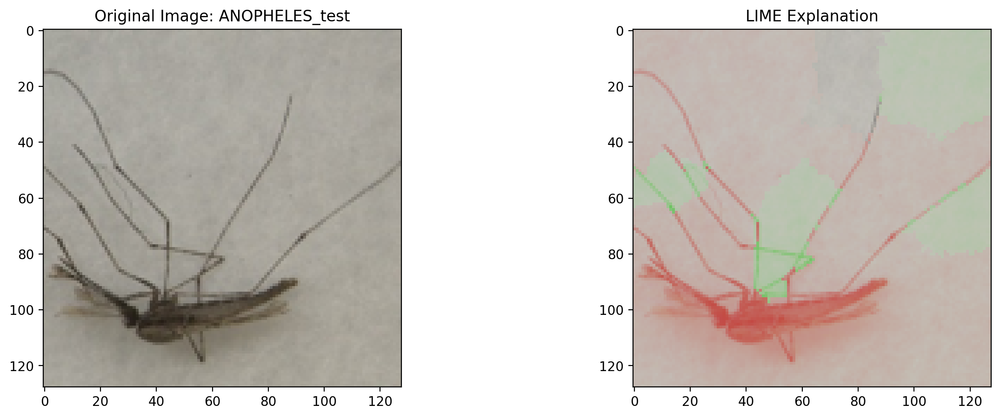

Predicted class: ANOPHELES
LIME Textual Explanation:  [[[0.7058824  0.6431373  0.6117647 ]
  [0.7058824  0.65882355 0.627451  ]
  [0.7058824  0.65882355 0.627451  ]
  ...
  [0.6431373  0.7058824  0.59607846]
  [0.6509804  0.7058824  0.6039216 ]
  [0.6509804  0.7058824  0.6039216 ]]

 [[0.7058824  0.6509804  0.61960787]
  [0.7058824  0.6627451  0.6313726 ]
  [0.7058824  0.65882355 0.627451  ]
  ...
  [0.65882355 0.7058824  0.6117647 ]
  [0.6627451  0.7058824  0.6156863 ]
  [0.67058825 0.7058824  0.62352943]]

 [[0.7058824  0.6509804  0.61960787]
  [0.7058824  0.6627451  0.6313726 ]
  [0.7058824  0.654902   0.62352943]
  ...
  [0.6509804  0.7058824  0.6039216 ]
  [0.6509804  0.7058824  0.6039216 ]
  [0.65882355 0.7058824  0.6117647 ]]

 ...

 [[0.7058824  0.64705884 0.6117647 ]
  [0.7058824  0.6509804  0.6156863 ]
  [0.7058824  0.654902   0.6156863 ]
  ...
  [0.7058824  0.654902   0.6117647 ]
  [0.7058824  0.6509804  0.6039216 ]
  [0.7058824  0.6509804  0.6039216 ]]

 [[0.7058824  0.6431

  0%|          | 0/100 [00:00<?, ?it/s]

1/1 [==============================] - 0s 38ms/step


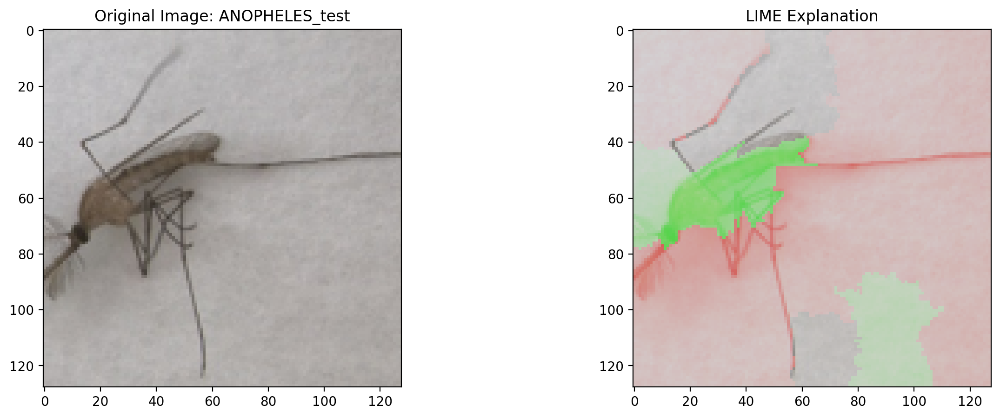

Predicted class: ANOPHELES
LIME Textual Explanation:  [[[0.7882353  0.7607843  0.7647059 ]
  [0.7882353  0.7411765  0.74509805]
  [0.7882353  0.7372549  0.7411765 ]
  ...
  [0.7882353  0.68235296 0.6784314 ]
  [0.7882353  0.68235296 0.6784314 ]
  [0.7882353  0.65882355 0.654902  ]]

 [[0.7882353  0.7647059  0.76862746]
  [0.7882353  0.7529412  0.75686276]
  [0.7882353  0.7490196  0.7490196 ]
  ...
  [0.7882353  0.6745098  0.67058825]
  [0.7882353  0.6745098  0.67058825]
  [0.7882353  0.67058825 0.6666667 ]]

 [[0.7882353  0.7647059  0.76862746]
  [0.7882353  0.75686276 0.7607843 ]
  [0.7882353  0.76862746 0.76862746]
  ...
  [0.7882353  0.6627451  0.65882355]
  [0.7882353  0.6509804  0.64705884]
  [0.7882353  0.6627451  0.65882355]]

 ...

 [[0.7882353  0.6862745  0.68235296]
  [0.7882353  0.6901961  0.6862745 ]
  [0.7882353  0.6784314  0.6745098 ]
  ...
  [0.7882353  0.654902   0.6392157 ]
  [0.7882353  0.6431373  0.627451  ]
  [0.7882353  0.6509804  0.63529414]]

 [[0.7882353  0.6784

  0%|          | 0/100 [00:00<?, ?it/s]

1/1 [==============================] - 0s 79ms/step


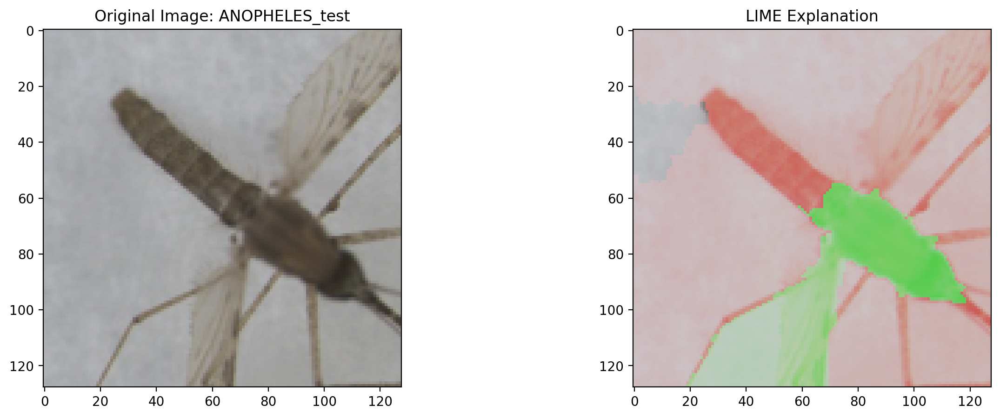

Predicted class: ANOPHELES
LIME Textual Explanation:  [[[0.7529412  0.6745098  0.6784314 ]
  [0.7529412  0.68235296 0.69411767]
  [0.7529412  0.6901961  0.70980394]
  ...
  [0.7529412  0.62352943 0.6039216 ]
  [0.7529412  0.60784316 0.5647059 ]
  [0.7529412  0.5921569  0.56078434]]

 [[0.7529412  0.6862745  0.6901961 ]
  [0.7529412  0.69411767 0.7058824 ]
  [0.7529412  0.69803923 0.7137255 ]
  ...
  [0.7529412  0.6313726  0.60784316]
  [0.7529412  0.6117647  0.5764706 ]
  [0.7529412  0.56078434 0.5294118 ]]

 [[0.7529412  0.68235296 0.6901961 ]
  [0.7529412  0.6862745  0.69803923]
  [0.7529412  0.69411767 0.70980394]
  ...
  [0.7529412  0.61960787 0.59607846]
  [0.7529412  0.59607846 0.57254905]
  [0.7529412  0.5137255  0.48235294]]

 ...

 [[0.7529412  0.6745098  0.6901961 ]
  [0.7529412  0.65882355 0.6745098 ]
  [0.7529412  0.6666667  0.68235296]
  ...
  [0.7529412  0.6509804  0.6313726 ]
  [0.7529412  0.6313726  0.6156863 ]
  [0.7529412  0.627451   0.60784316]]

 [[0.7529412  0.6705

  0%|          | 0/100 [00:00<?, ?it/s]

1/1 [==============================] - 0s 105ms/step


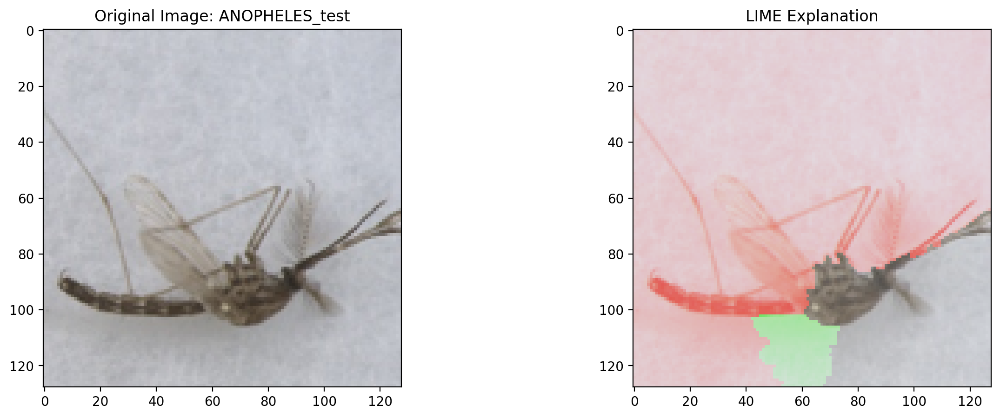

Predicted class: ANOPHELES
LIME Textual Explanation:  [[[0.8627451  0.7882353  0.81960785]
  [0.8627451  0.7882353  0.81960785]
  [0.8627451  0.77254903 0.8039216 ]
  ...
  [0.8627451  0.7607843  0.79607844]
  [0.8627451  0.7647059  0.8       ]
  [0.8627451  0.76862746 0.8039216 ]]

 [[0.8627451  0.7764706  0.80784315]
  [0.8627451  0.78039217 0.8117647 ]
  [0.8627451  0.79607844 0.827451  ]
  ...
  [0.8627451  0.7647059  0.8       ]
  [0.8627451  0.76862746 0.8039216 ]
  [0.8627451  0.7764706  0.8117647 ]]

 [[0.8627451  0.77254903 0.79607844]
  [0.8627451  0.75686276 0.78039217]
  [0.8627451  0.77254903 0.79607844]
  ...
  [0.8627451  0.75686276 0.7921569 ]
  [0.8627451  0.76862746 0.8039216 ]
  [0.8627451  0.7764706  0.8117647 ]]

 ...

 [[0.8627451  0.7529412  0.77254903]
  [0.8627451  0.7529412  0.77254903]
  [0.8627451  0.7372549  0.75686276]
  ...
  [0.74509805 0.75686276 0.78431374]
  [0.73333335 0.74509805 0.77254903]
  [0.7176471  0.7294118  0.75686276]]

 [[0.8627451  0.7568

  0%|          | 0/100 [00:00<?, ?it/s]

1/1 [==============================] - 0s 35ms/step


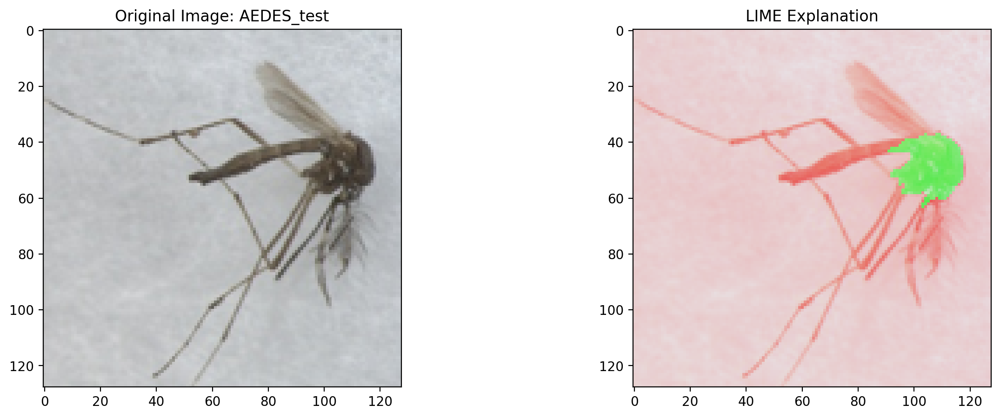

Predicted class: ANOPHELES
LIME Textual Explanation:  [[[0.8901961  0.7607843  0.7647059 ]
  [0.8901961  0.77254903 0.7764706 ]
  [0.8901961  0.75686276 0.7607843 ]
  ...
  [0.8901961  0.8235294  0.8392157 ]
  [0.8901961  0.7882353  0.8039216 ]
  [0.8901961  0.8117647  0.827451  ]]

 [[0.8901961  0.77254903 0.7764706 ]
  [0.8901961  0.76862746 0.77254903]
  [0.8901961  0.7607843  0.7647059 ]
  ...
  [0.8901961  0.83137256 0.84705883]
  [0.8901961  0.8156863  0.83137256]
  [0.8901961  0.8156863  0.83137256]]

 [[0.8901961  0.78039217 0.78431374]
  [0.8901961  0.76862746 0.77254903]
  [0.8901961  0.7607843  0.7647059 ]
  ...
  [0.8901961  0.7882353  0.8039216 ]
  [0.8901961  0.7647059  0.78039217]
  [0.8901961  0.78431374 0.8       ]]

 ...

 [[0.8901961  0.7764706  0.77254903]
  [0.8901961  0.77254903 0.78039217]
  [0.8901961  0.77254903 0.78039217]
  ...
  [0.8901961  0.7764706  0.79607844]
  [0.8901961  0.7647059  0.78431374]
  [0.8901961  0.75686276 0.7764706 ]]

 [[0.8901961  0.7764

  0%|          | 0/100 [00:00<?, ?it/s]

1/1 [==============================] - 0s 21ms/step


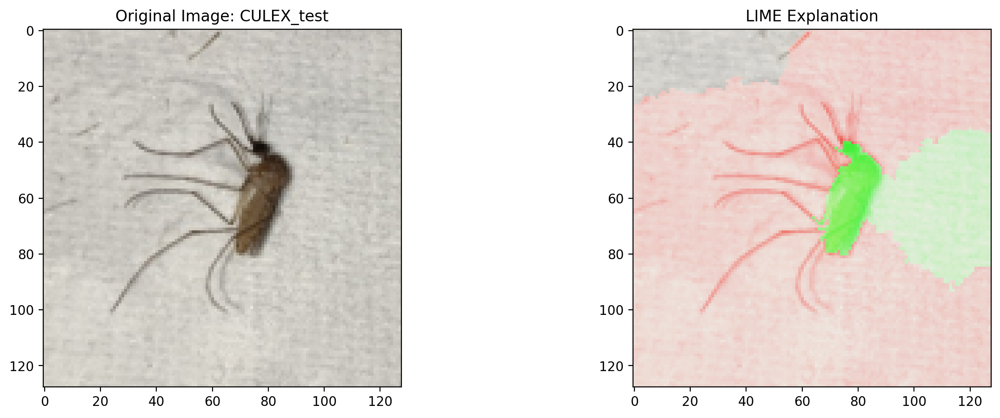

Predicted class: ANOPHELES
LIME Textual Explanation:  [[[0.78039217 0.76862746 0.7411765 ]
  [0.78039217 0.76862746 0.7411765 ]
  [0.77254903 0.7607843  0.73333335]
  ...
  [0.91764706 0.7490196  0.7294118 ]
  [0.91764706 0.7372549  0.7176471 ]
  [0.91764706 0.7490196  0.7294118 ]]

 [[0.8117647  0.8        0.77254903]
  [0.8039216  0.7921569  0.7647059 ]
  [0.8117647  0.8        0.77254903]
  ...
  [0.91764706 0.7882353  0.76862746]
  [0.91764706 0.75686276 0.7372549 ]
  [0.91764706 0.7411765  0.72156864]]

 [[0.79607844 0.78431374 0.75686276]
  [0.7921569  0.78039217 0.7529412 ]
  [0.7882353  0.7764706  0.7490196 ]
  ...
  [0.91764706 0.79607844 0.7764706 ]
  [0.91764706 0.77254903 0.7529412 ]
  [0.91764706 0.77254903 0.7529412 ]]

 ...

 [[0.91764706 0.8156863  0.78039217]
  [0.91764706 0.81960785 0.78431374]
  [0.91764706 0.81960785 0.78431374]
  ...
  [0.91764706 0.81960785 0.7921569 ]
  [0.91764706 0.78431374 0.75686276]
  [0.91764706 0.76862746 0.7411765 ]]

 [[0.91764706 0.8274

  0%|          | 0/100 [00:00<?, ?it/s]

1/1 [==============================] - 0s 22ms/step


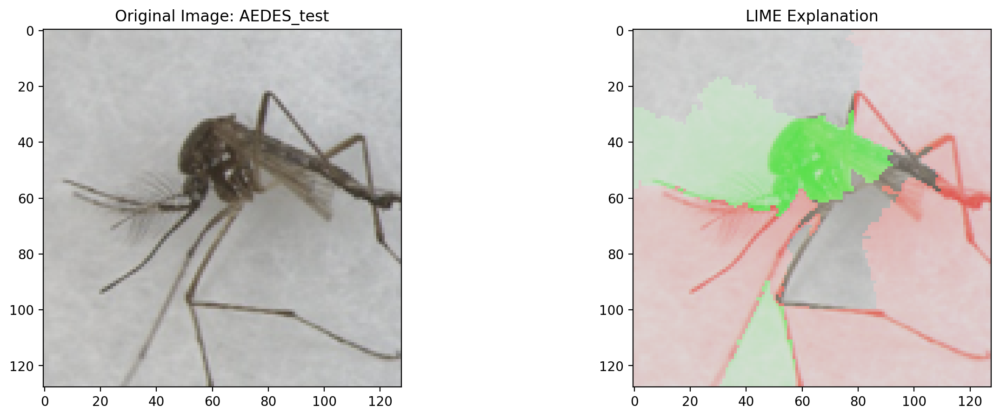

Predicted class: ANOPHELES
LIME Textual Explanation:  [[[0.7607843  0.7607843  0.7529412 ]
  [0.7647059  0.7647059  0.75686276]
  [0.7529412  0.7529412  0.74509805]
  ...
  [0.84705883 0.7921569  0.8039216 ]
  [0.84705883 0.7921569  0.80784315]
  [0.84705883 0.79607844 0.8117647 ]]

 [[0.7764706  0.7764706  0.76862746]
  [0.7764706  0.7764706  0.76862746]
  [0.7607843  0.7607843  0.7529412 ]
  ...
  [0.84705883 0.8117647  0.8235294 ]
  [0.84705883 0.8        0.81960785]
  [0.84705883 0.79607844 0.8117647 ]]

 [[0.77254903 0.77254903 0.7647059 ]
  [0.7647059  0.7647059  0.75686276]
  [0.7529412  0.7529412  0.74509805]
  ...
  [0.84705883 0.8117647  0.81960785]
  [0.84705883 0.8039216  0.8117647 ]
  [0.84705883 0.79607844 0.80784315]]

 ...

 [[0.84705883 0.74509805 0.74509805]
  [0.84705883 0.74509805 0.74509805]
  [0.84705883 0.7372549  0.7372549 ]
  ...
  [0.84705883 0.7411765  0.7490196 ]
  [0.84705883 0.7529412  0.7607843 ]
  [0.84705883 0.7490196  0.75686276]]

 [[0.84705883 0.7490

  0%|          | 0/100 [00:00<?, ?it/s]

1/1 [==============================] - 0s 32ms/step


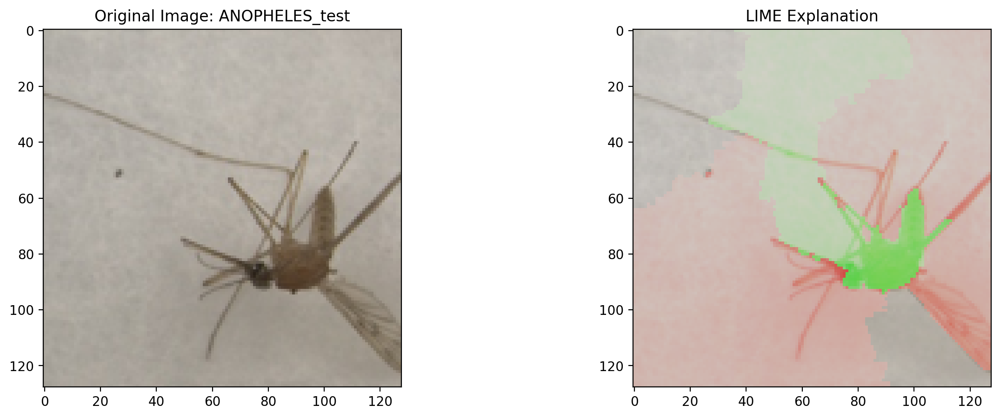

Predicted class: ANOPHELES
LIME Textual Explanation:  [[[0.7058824  0.69411767 0.65882355]
  [0.6901961  0.6784314  0.6431373 ]
  [0.6862745  0.6745098  0.6392157 ]
  ...
  [0.77254903 0.6784314  0.64705884]
  [0.77254903 0.6784314  0.64705884]
  [0.77254903 0.6784314  0.64705884]]

 [[0.69803923 0.6862745  0.6509804 ]
  [0.69803923 0.6862745  0.6509804 ]
  [0.6901961  0.6784314  0.6431373 ]
  ...
  [0.77254903 0.6901961  0.65882355]
  [0.77254903 0.6901961  0.65882355]
  [0.77254903 0.6862745  0.654902  ]]

 [[0.68235296 0.67058825 0.6431373 ]
  [0.69411767 0.68235296 0.654902  ]
  [0.69803923 0.6862745  0.654902  ]
  ...
  [0.77254903 0.6901961  0.65882355]
  [0.77254903 0.6862745  0.654902  ]
  [0.77254903 0.68235296 0.6509804 ]]

 ...

 [[0.77254903 0.63529414 0.6       ]
  [0.77254903 0.6431373  0.60784316]
  [0.77254903 0.6392157  0.6039216 ]
  ...
  [0.6392157  0.6039216  0.5686275 ]
  [0.6431373  0.6156863  0.57254905]
  [0.6431373  0.6156863  0.57254905]]

 [[0.77254903 0.6196

  0%|          | 0/100 [00:00<?, ?it/s]

1/1 [==============================] - 0s 43ms/step


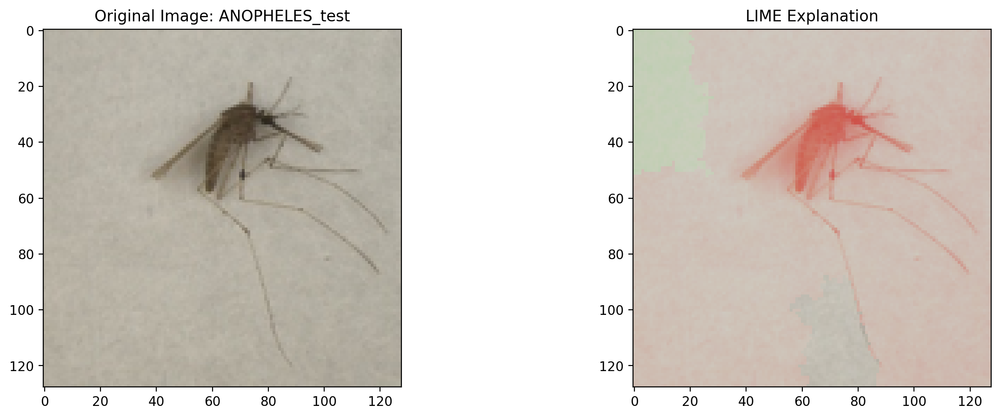

Predicted class: ANOPHELES
LIME Textual Explanation:  [[[0.68235296 0.7607843  0.62352943]
  [0.69411767 0.7607843  0.63529414]
  [0.69803923 0.7607843  0.63529414]
  ...
  [0.7607843  0.67058825 0.6313726 ]
  [0.7607843  0.6862745  0.6509804 ]
  [0.7607843  0.68235296 0.64705884]]

 [[0.6862745  0.7607843  0.627451  ]
  [0.70980394 0.7607843  0.64705884]
  [0.72156864 0.7607843  0.65882355]
  ...
  [0.7607843  0.68235296 0.6431373 ]
  [0.7607843  0.6901961  0.654902  ]
  [0.7607843  0.6862745  0.6509804 ]]

 [[0.68235296 0.7607843  0.62352943]
  [0.7058824  0.7607843  0.6431373 ]
  [0.7137255  0.7607843  0.6509804 ]
  ...
  [0.7607843  0.6901961  0.6509804 ]
  [0.7607843  0.68235296 0.64705884]
  [0.7607843  0.6862745  0.6509804 ]]

 ...

 [[0.7607843  0.68235296 0.627451  ]
  [0.7607843  0.6666667  0.6117647 ]
  [0.7607843  0.6901961  0.63529414]
  ...
  [0.7607843  0.6784314  0.61960787]
  [0.7607843  0.67058825 0.6156863 ]
  [0.7607843  0.6745098  0.61960787]]

 [[0.7607843  0.6627

  0%|          | 0/100 [00:00<?, ?it/s]

1/1 [==============================] - 0s 28ms/step


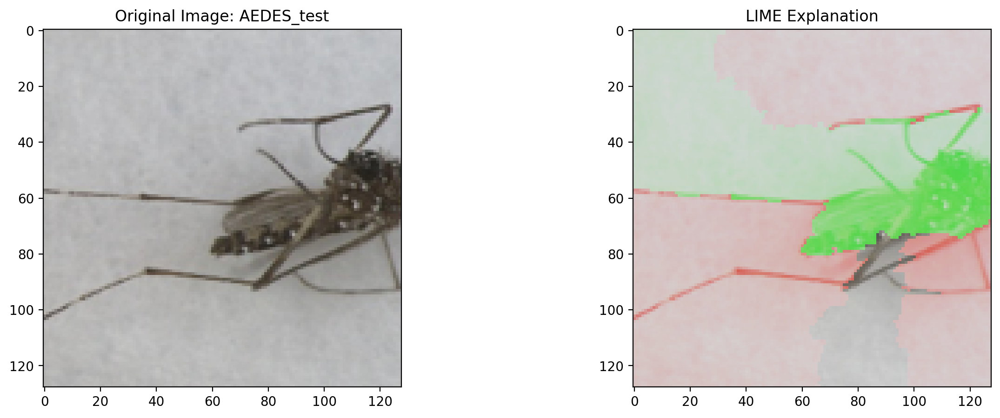

Predicted class: ANOPHELES
LIME Textual Explanation:  [[[0.7254902  0.8        0.7176471 ]
  [0.72156864 0.8        0.7137255 ]
  [0.72156864 0.8        0.7176471 ]
  ...
  [0.8        0.7607843  0.7764706 ]
  [0.8        0.7607843  0.7764706 ]
  [0.8        0.7647059  0.78039217]]

 [[0.73333335 0.8        0.7294118 ]
  [0.7372549  0.8        0.73333335]
  [0.7372549  0.8        0.7372549 ]
  ...
  [0.8        0.77254903 0.7882353 ]
  [0.8        0.77254903 0.7882353 ]
  [0.8        0.7764706  0.7921569 ]]

 [[0.72156864 0.8        0.7176471 ]
  [0.7254902  0.8        0.7254902 ]
  [0.7294118  0.8        0.7294118 ]
  ...
  [0.8        0.75686276 0.77254903]
  [0.8        0.7607843  0.7764706 ]
  [0.8        0.7607843  0.7764706 ]]

 ...

 [[0.8        0.69411767 0.6862745 ]
  [0.8        0.7019608  0.69411767]
  [0.8        0.7137255  0.70980394]
  ...
  [0.8        0.75686276 0.7647059 ]
  [0.8        0.75686276 0.7607843 ]
  [0.8        0.7490196  0.7490196 ]]

 [[0.8        0.6901

In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras.models import load_model
from lime.lime_image import LimeImageExplainer

# Function to generate textual explanation using LIME
def generate_textual_explanation(img_array, model, explainer):
    explanation_instance = explainer.explain_instance(img_array, model.predict, top_labels=1, hide_color=0, num_samples=100)
    explanation_text = explanation_instance.get_image_and_mask(explanation_instance.top_labels[0], positive_only=False, num_features=10, hide_rest=False)[0]
    return explanation_text

# Select 4 random images
random_indices = np.random.choice(len(normalized_images), 10, replace=False)

# Loop through each selected image and model to generate explanations and visualizations
for idx in random_indices:
    img_array = normalized_images[idx]
    file_name = file_names[idx]

    for model_name, model in loaded_models.items():
        print(f"Model Name: {model_name}")  # Print the model name
        print(f"Image Name: {file_name}")

        # Get model predictions for the input image
        predictions = model.predict(np.expand_dims(img_array, axis=0))

        # Get the predicted class label using the label encoder
        predicted_indices = np.argmax(predictions, axis=1)
        predicted_class_label = class_labels[predicted_indices[0]]
        print(f"Predicted Class Label: {predicted_class_label}")  # Print the predicted class label

        explanation = f"Predicted class: {predicted_class_label}"

        # Generate LIME explanation as textual explanation
        explainer = LimeImageExplainer()
        explanation_text = generate_textual_explanation(img_array, model, explainer)

        # Plot the original image and LIME explanation
        plt.figure(figsize=(15, 5))
        plt.subplot(1, 2, 1)
        plt.imshow(img_array)
        plt.title(f"Original Image: {file_name}")
        plt.subplot(1, 2, 2)
        plt.imshow(explanation_text, cmap='jet', alpha=0.8)
        plt.title("LIME Explanation")
        plt.show()

        print(explanation)
        print("LIME Textual Explanation: ", explanation_text)


# SHAP

In [ ]:
!pip install shap

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 540.5/540.5 kB 3.2 MB/s eta 0:00:00


In [ ]:
import shap
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt

# Load the MPANet model
model = tf.keras.models.load_model('MPANet.h5')

# Ensure the model is in inference mode
model(tf.constant(np.zeros((1,) + model.input_shape[1:]), dtype=tf.float32), training=False)

# Use a subset of normalized_images for the explainer
background = normalized_images[:2]

# Convert inputs to numpy arrays if they are not already
background_np = np.array(background)
normalized_images_np = np.array(normalized_images[:2])

# Create a SHAP GradientExplainer
explainer = shap.GradientExplainer((model.input, model.output), background_np)

# Generate SHAP values
shap_values = explainer.shap_values(normalized_images_np)

# Ensure the SHAP values and images are correctly formatted for shap.force_plot
shap_values_np = np.array(shap_values)

# Calculate the expected value for the model
expected_value = explainer.expected_value

# Visualize SHAP values for test images
for i in range(len(normalized_images_np)):
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.imshow(normalized_images_np[i] / 255.0)  # Display the original image
    plt.title("Original Image")
    plt.axis('off')

    plt.subplot(1, 2, 2)
    shap.force_plot(expected_value[0], shap_values_np[i].flatten(), normalized_images_np[i].flatten())  # Overlay SHAP explanation
    plt.title("SHAP Explanation")
    plt.show()

TypeError: 'tuple' object is not callable

In [ ]:
import shap
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt

# Load the MPANet model
model = tf.keras.models.load_model('MPANet.h5')

# Ensure the model is in inference mode
model(tf.constant(np.zeros((1,) + model.input_shape[1:]), dtype=tf.float32), training=False)

# Use a subset of normalized_images for the explainer
background = normalized_images[:2]

# Convert inputs to numpy arrays if they are not already
background_np = np.array(background)
normalized_images_np = np.array(normalized_images[:2])

# Define a function that performs model prediction
def model_predict(images):
    return model(images).numpy()

# Create a SHAP Explainer with the model prediction function
explainer = shap.Explainer(model_predict, masker, output_names=model.output_names)

# Here we use 500 evaluations of the underlying model to estimate the SHAP values
shap_values = explainer(normalized_images_np[1:3], max_evals=500, batch_size=50)

# Use the SHAP image plot function to visualize the results
shap.image_plot(shap_values)
